In [4]:
# Dependencies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import requests
from census import Census
import gmaps
import os
from us import states
from pathlib import Path
%matplotlib inline

# Census & gmaps API Keys
api_key = os.getenv("CENSUS_API_KEY")
mapbox_key = os.getenv("MAPBOX_API_KEY")
c_2018 = Census(api_key, year=2018)
c_2017 = Census(api_key, year=2017)
c_2016 = Census(api_key, year=2016)
c_2015 = Census(api_key, year=2015)
c_2014 = Census(api_key, year=2014)
c_2013 = Census(api_key, year=2013)
c_2012 = Census(api_key, year=2012)
c_2011 = Census(api_key, year=2011)
c_2010 = Census(api_key, year=2010)
c_2009 = Census(api_key, year=2009)
c_2008 = Census(api_key, year=2008)
c_2007 = Census(api_key, year=2007)
c_2006 = Census(api_key, year=2006)
c_2005 = Census(api_key, year=2005)
c_2004 = Census(api_key, year=2004)

# Configure gmaps
# gmaps.configure(api_key=gkey)

In [58]:
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
from matplotlib import style
import seaborn as sns
import hvplot.pandas
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

# Import panel packages for dashboard
import panel as pn
import plotly.express as px
from panel.interact import interact
from panel import widgets

# Initialize extensions for plotly panel
pn.extension('plotly')
pn.extension()

style.use('ggplot')

In [62]:
# Could read in data directly after fetching in the first run and save as pickle below
# census_occupation_gender_df = pd.read_pickle("census_2010_2018_panel_index_free_df.pickle")
census_occupation_gender_df = pd.read_pickle("census_2010_2018_panel_df.pickle").reset_index()
census_occupation_gender_df

,Year,State,County,Name,Population,Median Age,Household Income,Per Capita Income,Poverty Count,Poverty Rate,...,Employed_female,Financial_managers_female,Financial_specialists_female,Accountants_&_auditors_female,Computer_female,Software_devops_female,Database_&_system_female,Information_age16+_total,Finance_and_insurance,Real_estate
0,2010,36,005,"Bronx County, New York",1386657.0,32.8,32568.0,16671.0,408584.0,29.465398,...,184353.0,1549.0,4344.0,3544.0,926.0,362.0,0.0,49090.0,45770.0,39340.0
1,2010,36,047,"Kings County, New York",2508340.0,34.2,42143.0,23218.0,571936.0,22.801375,...,376222.0,3503.0,10787.0,7354.0,4383.0,2111.0,585.0,56023.0,60058.0,41348.0
2,2010,36,061,"New York County, New York",1586698.0,36.4,63832.0,56556.0,254289.0,16.026301,...,285240.0,3924.0,13964.0,7023.0,3815.0,1090.0,352.0,82014.0,125112.0,42421.0
3,2010,36,081,"Queens County, New York",2233841.0,37.3,53054.0,24530.0,332165.0,14.869680,...,332019.0,3813.0,13008.0,9999.0,3256.0,1310.0,199.0,52500.0,61474.0,42878.0
4,2010,36,085,"Richmond County, New York",469363.0,38.7,70560.0,30122.0,54353.0,11.580163,...,63558.0,943.0,1931.0,1726.0,1021.0,765.0,80.0,65619.0,66770.0,70510.0
5,2011,36,005,"Bronx County, New York",1392002.0,32.8,32058.0,16879.0,412139.0,29.607644,...,179248.0,649.0,4054.0,2772.0,646.0,182.0,44.0,51105.0,47753.0,41363.0
6,2011,36,047,"Kings County, New York",2532645.0,34.2,42752.0,23577.0,592789.0,23.405925,...,374970.0,3339.0,9384.0,6690.0,5266.0,2526.0,201.0,58461.0,66901.0,39610.0
7,2011,36,061,"New York County, New York",1601948.0,36.5,66299.0,59398.0,284572.0,17.764122,...,284537.0,3994.0,13585.0,7661.0,4919.0,1650.0,669.0,71553.0,133754.0,52790.0
8,2011,36,081,"Queens County, New York",2247848.0,37.4,53572.0,25088.0,351223.0,15.624855,...,330073.0,4934.0,12396.0,9379.0,4813.0,2046.0,866.0,60613.0,58618.0,45048.0
9,2011,36,085,"Richmond County, New York",470467.0,38.6,70578.0,30274.0,54365.0,11.555539,...,67402.0,821.0,1964.0,1705.0,935.0,596.0,0.0,71498.0,65113.0,56311.0


In [174]:
fig_software_male = census_occupation_gender_df.hvplot.line(
    x='Year', y='Software_devops_male', rot=45,
    title='Software Developers by County - Male', groupby='Name', ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_software_male

:DynamicMap   [Name]
   :Curve   [Year]   (Software_devops_male)

In [187]:
fig_software_female = census_occupation_gender_df.hvplot.line(
    x='Year', y='Software_devops_female', rot=45,
    title='Software Developers by County - Female', groupby='Name', ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_software_female

:DynamicMap   [Name]
   :Curve   [Year]   (Software_devops_female)

In [191]:
fig_software_overlay = fig_software_male * fig_software_female
fig_software_overlay.opts(title='Software Developers by County')
fig_software_overlay

:DynamicMap   [Name]
   :Overlay
      .Curve.I  :Curve   [Year]   (Software_devops_male)
      .Curve.II :Curve   [Year]   (Software_devops_female)

In [325]:
fig_finance_male = census_occupation_gender_df.hvplot.line(
    x='Year', y='Financial_specialists_male', rot=45,
    title='Financial Specialists by County - Male', groupby='Name', ylabel='Financial Specialists (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_finance_male

:DynamicMap   [Name]
   :Curve   [Year]   (Financial_specialists_male)

In [327]:
fig_finance_female = census_occupation_gender_df.hvplot.line(
    x='Year', y='Financial_specialists_female', rot=45,
    title='Financial Specialists by County - Female', groupby='Name', ylabel='Financial Specialists (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_finance_female

:DynamicMap   [Name]
   :Curve   [Year]   (Financial_specialists_female)

In [328]:
fig_finance_overlay = fig_finance_male * fig_finance_female
fig_finance_overlay.opts(title='Financial Specialists by County')
fig_finance_overlay

:DynamicMap   [Name]
   :Overlay
      .Curve.I  :Curve   [Year]   (Financial_specialists_male)
      .Curve.II :Curve   [Year]   (Financial_specialists_female)

In [385]:
average_software_female = (census_occupation_gender_df).groupby([census_occupation_gender_df['Name']]).mean()
average_software_female.reset_index(inplace=True)
average_software_female.sort_values(by='Software_devops_female', ascending=False, inplace=True)
mean_software_female = average_software_female.round(3)
mean_software_female

,Name,Year,Population,Median Age,Household Income,Per Capita Income,Poverty Count,Poverty Rate,Employed_age16+_civilian,Employed_male,...,Employed_female,Financial_managers_female,Financial_specialists_female,Accountants_&_auditors_female,Computer_female,Software_devops_female,Database_&_system_female,Information_age16+_total,Finance_and_insurance,Real_estate
1,"Kings County, New York",2014,2590894.222,34.622,50007.111,27899.111,568493.222,21.956,840661.222,443042.222,...,397619.000,3811.444,11011.889,7678.222,5967.889,2836.333,531.556,67042.111,76155.222,46699.333
2,"New York County, New York",2014,1627982.556,36.833,74308.889,65171.889,273449.778,16.799,647964.000,343891.667,...,304072.333,6058.889,12861.889,6824.667,6276.778,2125.444,525.889,88255.222,140888.778,60384.333
3,"Queens County, New York",2014,2297989.667,38.000,59070.778,27346.111,323003.444,14.070,816705.667,462880.667,...,353825.000,4469.778,13335.778,9757.444,4512.778,1747.667,329.111,61651.111,66784.556,46760.000
4,"Richmond County, New York",2014,473629.778,39.500,73671.222,32259.444,58790.111,12.412,157327.889,89077.778,...,68250.111,960.333,2371.444,1769.556,994.333,532.889,41.222,68742.667,77738.111,56495.556
0,"Bronx County, New York",2014,1428720.000,33.433,34708.000,18630.667,415632.556,29.103,398101.778,211758.222,...,186343.556,1412.778,4089.444,2764.667,1041.000,246.222,79.667,49848.778,52009.222,39894.889


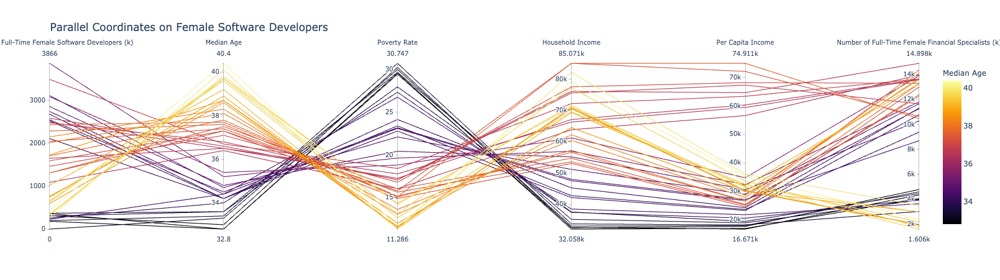

In [392]:
# 1. Parallel Coordinates Plot
plot_parallel_coordinates_software_female = px.parallel_coordinates(
        census_occupation_gender_df,
        dimensions=['Software_devops_female', 'Median Age', 'Poverty Rate', 'Household Income', 'Per Capita Income', 'Financial_specialists_female'],
        color='Median Age',
        color_continuous_scale=px.colors.sequential.Inferno,
        title='Parallel Coordinates on Female Software Developers',
        labels={
            "Software_devops_female": "Number of Full-Time Female Software Developers (k)",
            "Median Age": "Median Age",
            'Poverty Rate': 'Poverty Rate',
            "Household Income": "Household Income",
            'Per Capita Income': 'Per Capita Income', 
            'Financial_specialists_female' : "Number of Full-Time Female Financial Specialists (k)"
            
        }
    )
    
plot_parallel_coordinates_software_female

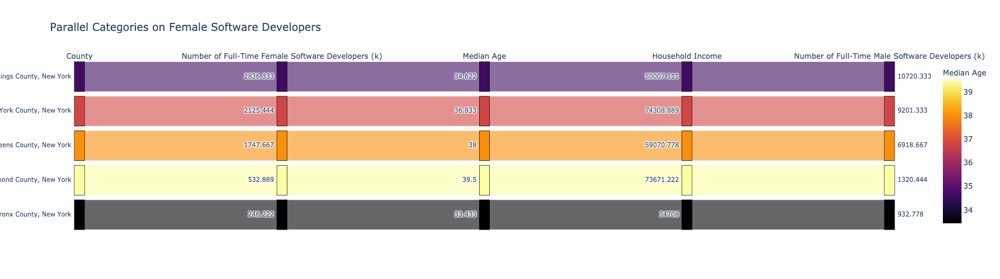

In [387]:
# 2. Parallel Categories Plot
plot_parallel_categories_software_female = px.parallel_categories(
        mean_software_female,
        dimensions=['Name', 'Software_devops_female', 'Median Age', 'Household Income', 'Software_devops_male'],
        color='Median Age',
        color_continuous_scale=px.colors.sequential.Inferno, 
        title='Parallel Categories on Female Software Developers',
        labels={
           #     'Year': 'Year',
            'Name': 'County',
            "Software_devops_female": "Number of Full-Time Female Software Developers (k)",
            "Median Age": "Median Age",
            "Household Income": "Household Income",
  #          'Per Capita Income': 'Per Capita Income', 
  #          'Poverty Rate': 'Poverty Rate',
            'Software_devops_male': 'Number of Full-Time Male Software Developers (k)'
            
        }
    )
    
plot_parallel_categories_software_female

In [293]:
fig_scatter_software_female_age_annual = census_occupation_gender_df.hvplot.scatter(
    x='Median Age', y='Software_devops_female', rot=45,
    label='Developers vs. Age - Female', groupby=['Year'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_scatter_software_female_age_annual

:DynamicMap   [Year]
   :Scatter   [Median Age]   (Software_devops_female)

In [294]:
fig_scatter_software_male_age_annual = census_occupation_gender_df.hvplot.scatter(
    x='Median Age', y='Software_devops_male', rot=45,
    label='Developers vs. Age - Male', groupby=['Year'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_scatter_software_male_age_annual

:DynamicMap   [Year]
   :Scatter   [Median Age]   (Software_devops_male)

In [295]:
fig_scatter_software_age_annual_overlay = fig_scatter_software_male_age_annual * fig_scatter_software_female_age_annual
fig_scatter_software_age_annual_overlay.opts(title='Developers vs. County Median Age by Year')
fig_scatter_software_age_annual_overlay

:DynamicMap   [Year]
   :Overlay
      .Scatter.Developers_vs_full_stop_Age_hyphen_minus_Male   :Scatter   [Median Age]   (Software_devops_male)
      .Scatter.Developers_vs_full_stop_Age_hyphen_minus_Female :Scatter   [Median Age]   (Software_devops_female)

In [296]:
fig_scatter_software_female_age_county = census_occupation_gender_df.hvplot.scatter(
    x='Median Age', y='Software_devops_female', rot=45,
    label='Developers vs. Age - Female', groupby=['Name'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_scatter_software_female_age_county

:DynamicMap   [Name]
   :Scatter   [Median Age]   (Software_devops_female)

In [297]:
fig_scatter_software_male_age_county = census_occupation_gender_df.hvplot.scatter(
    x='Median Age', y='Software_devops_male', rot=45,
    label='Developers vs. Age - Male', groupby=['Name'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_scatter_software_male_age_county

:DynamicMap   [Name]
   :Scatter   [Median Age]   (Software_devops_male)

In [298]:
fig_scatter_software_age_county_overlay = fig_scatter_software_male_age_county * fig_scatter_software_female_age_county
fig_scatter_software_age_county_overlay.opts(title='Developers vs. Median Age by County')
fig_scatter_software_age_county_overlay

:DynamicMap   [Name]
   :Overlay
      .Scatter.Developers_vs_full_stop_Age_hyphen_minus_Male   :Scatter   [Median Age]   (Software_devops_male)
      .Scatter.Developers_vs_full_stop_Age_hyphen_minus_Female :Scatter   [Median Age]   (Software_devops_female)

In [299]:
fig_scatter_software_female_household_income_annual = census_occupation_gender_df.hvplot.scatter(
    x='Household Income', y='Software_devops_female', rot=45,
    label='Developers vs. Household Income - Female', groupby=['Year'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_scatter_software_female_household_income_annual

:DynamicMap   [Year]
   :Scatter   [Household Income]   (Software_devops_female)

In [303]:
fig_scatter_software_male_household_income_annual = census_occupation_gender_df.hvplot.scatter(
    x='Household Income', y='Software_devops_male', rot=45,
    label='Developers vs. Household Income - Male', groupby=['Year'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_scatter_software_male_household_income_annual

:DynamicMap   [Year]
   :Scatter   [Household Income]   (Software_devops_male)

In [304]:
fig_scatter_software_household_income_annual_overlay = fig_scatter_software_male_household_income_annual * fig_scatter_software_female_household_income_annual
fig_scatter_software_household_income_annual_overlay.opts(title='Developers vs. Annual Household Income')
fig_scatter_software_household_income_annual_overlay

:DynamicMap   [Year]
   :Overlay
      .Scatter.Developers_vs_full_stop_Household_Income_hyphen_minus_Male   :Scatter   [Household Income]   (Software_devops_male)
      .Scatter.Developers_vs_full_stop_Household_Income_hyphen_minus_Female :Scatter   [Household Income]   (Software_devops_female)

In [305]:
fig_scatter_software_female_household_income_county = census_occupation_gender_df.hvplot.scatter(
    x='Household Income', y='Software_devops_female', rot=45,
    label='Developers vs. Household Income - Female', groupby=['Name'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_scatter_software_female_household_income_county

:DynamicMap   [Name]
   :Scatter   [Household Income]   (Software_devops_female)

In [307]:
fig_scatter_software_male_household_income_county = census_occupation_gender_df.hvplot.scatter(
    x='Household Income', y='Software_devops_male', rot=45,
    label='Developers vs. Household Income - Male', groupby=['Name'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_scatter_software_male_household_income_county

:DynamicMap   [Name]
   :Scatter   [Household Income]   (Software_devops_male)

In [308]:
fig_scatter_software_household_income_county_overlay = fig_scatter_software_male_household_income_county * fig_scatter_software_female_household_income_county
fig_scatter_software_household_income_county_overlay.opts(title='Developers vs. Household Income by County')
fig_scatter_software_household_income_county_overlay

:DynamicMap   [Name]
   :Overlay
      .Scatter.Developers_vs_full_stop_Household_Income_hyphen_minus_Male   :Scatter   [Household Income]   (Software_devops_male)
      .Scatter.Developers_vs_full_stop_Household_Income_hyphen_minus_Female :Scatter   [Household Income]   (Software_devops_female)

In [309]:
fig_scatter_software_female_percap_income_annual = census_occupation_gender_df.hvplot.scatter(
    x='Per Capita Income', y='Software_devops_female', rot=45,
    label='Software Developers vs. Per Capita Income - Female', groupby=['Year'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_scatter_software_female_percap_income_annual

:DynamicMap   [Year]
   :Scatter   [Per Capita Income]   (Software_devops_female)

In [310]:
fig_scatter_software_male_percap_income_annual = census_occupation_gender_df.hvplot.scatter(
    x='Per Capita Income', y='Software_devops_male', rot=45,
    label='Software Developers vs. Per Capita Income - Male', groupby=['Year'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_scatter_software_male_percap_income_annual

:DynamicMap   [Year]
   :Scatter   [Per Capita Income]   (Software_devops_male)

In [315]:
fig_scatter_software_percap_income_annual_overlay = fig_scatter_software_male_percap_income_annual * fig_scatter_software_female_percap_income_annual
fig_scatter_software_percap_income_annual_overlay.opts(title='Developers vs. Per Capita Income by Year')
fig_scatter_software_percap_income_annual_overlay

:DynamicMap   [Year]
   :Overlay
      .Scatter.Software_Developers_vs_full_stop_Per_Capita_Income_hyphen_minus_Male   :Scatter   [Per Capita Income]   (Software_devops_male)
      .Scatter.Software_Developers_vs_full_stop_Per_Capita_Income_hyphen_minus_Female :Scatter   [Per Capita Income]   (Software_devops_female)

In [313]:
fig_scatter_software_female_percap_income_county = census_occupation_gender_df.hvplot.scatter(
    x='Per Capita Income', y='Software_devops_female', rot=45,
    label='Software Developers vs. Per Capita Income - Female', groupby=['Name'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_scatter_software_female_percap_income_county

:DynamicMap   [Name]
   :Scatter   [Per Capita Income]   (Software_devops_female)

In [314]:
fig_scatter_software_male_percap_income_county = census_occupation_gender_df.hvplot.scatter(
    x='Per Capita Income', y='Software_devops_male', rot=45,
    label='Software Developers vs. Per Capita Income - Male', groupby=['Name'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_scatter_software_male_percap_income_county

:DynamicMap   [Name]
   :Scatter   [Per Capita Income]   (Software_devops_male)

In [316]:
fig_scatter_software_percap_income_county_overlay = fig_scatter_software_male_percap_income_county * fig_scatter_software_female_percap_income_county
fig_scatter_software_percap_income_county_overlay.opts(title='Developers vs. Per Capita Income by County')
fig_scatter_software_percap_income_county_overlay

:DynamicMap   [Name]
   :Overlay
      .Scatter.Software_Developers_vs_full_stop_Per_Capita_Income_hyphen_minus_Male   :Scatter   [Per Capita Income]   (Software_devops_male)
      .Scatter.Software_Developers_vs_full_stop_Per_Capita_Income_hyphen_minus_Female :Scatter   [Per Capita Income]   (Software_devops_female)

In [317]:
fig_scatter_software_female_poverty_annual = census_occupation_gender_df.hvplot.scatter(
    x='Poverty Rate', y='Software_devops_female', rot=45,
    label='Software Developers vs. Poverty Rate - Female', groupby=['Year'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_scatter_software_female_poverty_annual

:DynamicMap   [Year]
   :Scatter   [Poverty Rate]   (Software_devops_female)

In [318]:
fig_scatter_software_male_poverty_annual = census_occupation_gender_df.hvplot.scatter(
    x='Poverty Rate', y='Software_devops_male', rot=45,
    label='Software Developers vs. Poverty Rate - Male', groupby=['Year'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_scatter_software_male_poverty_annual

:DynamicMap   [Year]
   :Scatter   [Poverty Rate]   (Software_devops_male)

In [319]:
fig_scatter_software_poverty_annual_overlay = fig_scatter_software_male_poverty_annual * fig_scatter_software_female_poverty_annual
fig_scatter_software_poverty_annual_overlay.opts(title='Developers vs. Poverty Rate by Year')
fig_scatter_software_poverty_annual_overlay

:DynamicMap   [Year]
   :Overlay
      .Scatter.Software_Developers_vs_full_stop_Poverty_Rate_hyphen_minus_Male   :Scatter   [Poverty Rate]   (Software_devops_male)
      .Scatter.Software_Developers_vs_full_stop_Poverty_Rate_hyphen_minus_Female :Scatter   [Poverty Rate]   (Software_devops_female)

In [321]:
fig_scatter_software_female_poverty_county = census_occupation_gender_df.hvplot.scatter(
    x='Poverty Rate', y='Software_devops_female', rot=45,
    label='Software Developers vs. Poverty Rate - Female', groupby=['Name'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="deeppink",
    hover_line_color="darkorchid",
    bgcolor="lavender")
fig_scatter_software_female_poverty_county

:DynamicMap   [Name]
   :Scatter   [Poverty Rate]   (Software_devops_female)

In [322]:
fig_scatter_software_male_poverty_county = census_occupation_gender_df.hvplot.scatter(
    x='Poverty Rate', y='Software_devops_male', rot=45,
    label='Software Developers vs. Poverty Rate - Male', groupby=['Name'], ylabel='Software Developers (k)').opts(yformatter="%.0f",
    line_color="darkolivegreen",
    hover_line_color="black",
    bgcolor="lightblue")
fig_scatter_software_male_poverty_county

:DynamicMap   [Name]
   :Scatter   [Poverty Rate]   (Software_devops_male)

In [323]:
fig_scatter_software_poverty_county_overlay = fig_scatter_software_male_poverty_county * fig_scatter_software_female_poverty_county
fig_scatter_software_poverty_county_overlay.opts(title='Developers vs. Poverty Rate by County')
fig_scatter_software_poverty_county_overlay

:DynamicMap   [Name]
   :Overlay
      .Scatter.Software_Developers_vs_full_stop_Poverty_Rate_hyphen_minus_Male   :Scatter   [Poverty Rate]   (Software_devops_male)
      .Scatter.Software_Developers_vs_full_stop_Poverty_Rate_hyphen_minus_Female :Scatter   [Poverty Rate]   (Software_devops_female)

In [7]:
software_devops = pd.DataFrame()

software_devops['Year']=census_occupation_gender_df['Year']
software_devops['Name']=census_occupation_gender_df['Name']
software_devops['County']=census_occupation_gender_df['County']
software_devops['Software_devops_male']=census_occupation_gender_df['Software_devops_male']
software_devops['Software_devops_female']=census_occupation_gender_df['Software_devops_female']

software_devops

,Year,Name,County,Software_devops_male,Software_devops_female
0,2010,"Bronx County, New York",005,430.0,362.0
1,2010,"Kings County, New York",047,9372.0,2111.0
2,2010,"New York County, New York",061,7622.0,1090.0
3,2010,"Queens County, New York",081,4185.0,1310.0
4,2010,"Richmond County, New York",085,995.0,765.0
5,2011,"Bronx County, New York",005,994.0,182.0
6,2011,"Kings County, New York",047,9963.0,2526.0
7,2011,"New York County, New York",061,4917.0,1650.0
8,2011,"Queens County, New York",081,6753.0,2046.0
9,2011,"Richmond County, New York",085,1078.0,596.0


In [8]:
software_devops.set_index(['County','Year', 'Name'], inplace=True)
software_devops.sort_index()

Software_devops_male  \
County Year Name                                              
005    2010 Bronx County, New York                    430.0   
       2011 Bronx County, New York                    994.0   
       2012 Bronx County, New York                   1146.0   
       2013 Bronx County, New York                    728.0   
       2014 Bronx County, New York                    417.0   
       2015 Bronx County, New York                   1484.0   
       2016 Bronx County, New York                    655.0   
       2017 Bronx County, New York                    886.0   
       2018 Bronx County, New York                   1655.0   
047    2010 Kings County, New York                   9372.0   
       2011 Kings County, New York                   9963.0   
       2012 Kings County, New York                   9372.0   
       2013 Kings County, New York                   9112.0   
       2014 Kings County, New York                  10016.0   
       2015 Kings County, New York                  10376.0   
       2016 Kings County, New York                  12250.0   
       2017 Kings County, New York                  12181.0   
       2018 Kings County, New York                  13841.0   
061    2010 New York County, New York                7622.0   
       2011 New York County, New York                4917.0   
       2012 New York County, New York                7959.0   
       2013 New York County, New York                9701.0   
       2014 New York County, New York                7335.0   
       2015 New York County, New York               10863.0   
       2016 New York County, New York               10396.0   
       2017 New York County, New York               10229.0   
       2018 New York County, New York               13790.0   
081    2010 Queens County, New York                  4185.0   
       2011 Queens County, New York                  6753.0   
       2012 Queens County, New York                  6748.0   
       2013 Queens County, New York                  6815.0   
       2014 Queens County, New York                  6937.0   
       2015 Queens County, New York                  6142.0   
       2016 Queens County, New York                  7991.0   
       2017 Queens County, New York                  9778.0   
       2018 Queens County, New York                  6919.0   
085    2010 Richmond County, New York                 995.0   
       2011 Richmond County, New York                1078.0   
       2012 Richmond County, New York                1115.0   
       2013 Richmond County, New York                 999.0   
       2014 Richmond County, New York                 725.0   
       2015 Richmond County, New York                1234.0   
       2016 Richmond County, New York                1309.0   
       2017 Richmond County, New York                2311.0   
       2018 Richmond County, New York                2118.0   

                                       Software_devops_female  
County Year Name                                               
005    2010 Bronx County, New York                      362.0  
       2011 Bronx County, New York                      182.0  
       2012 Bronx County, New York                      313.0  
       2013 Bronx County, New York                        0.0  
       2014 Bronx County, New York                      198.0  
       2015 Bronx County, New York                      370.0  
       2016 Bronx County, New York                      306.0  
       2017 Bronx County, New York                      256.0  
       2018 Bronx County, New York                      229.0  
047    2010 Kings County, New York                     2111.0  
       2011 Kings County, New York                     2526.0  
       2012 Kings County, New York                     2676.0  
       2013 Kings County, New York                     2744.0  
       2014 Kings County, New York                     2549.0  
       2015 Kings County, New York                   

## Software Developers

In [9]:
software_devops_Bronx = software_devops.loc[['005']]
software_devops_Bronx

Software_devops_male  \
County Year Name                                           
005    2010 Bronx County, New York                 430.0   
       2011 Bronx County, New York                 994.0   
       2012 Bronx County, New York                1146.0   
       2013 Bronx County, New York                 728.0   
       2014 Bronx County, New York                 417.0   
       2015 Bronx County, New York                1484.0   
       2016 Bronx County, New York                 655.0   
       2017 Bronx County, New York                 886.0   
       2018 Bronx County, New York                1655.0   

                                    Software_devops_female  
County Year Name                                            
005    2010 Bronx County, New York                   362.0  
       2011 Bronx County, New York                   182.0  
       2012 Bronx County, New York                   313.0  
       2013 Bronx County, New York                     0.0  
       2014 Bronx County, New York                   198.0  
       2015 Bronx County, New York                   370.0  
       2016 Bronx County, New York                   306.0  
       2017 Bronx County, New York                   256.0  
       2018 Bronx County, New York                   229.0

In [10]:
software_devops_Brooklyn = software_devops.loc[['047']]
software_devops_Brooklyn 

Software_devops_male  \
County Year Name                                           
047    2010 Kings County, New York                9372.0   
       2011 Kings County, New York                9963.0   
       2012 Kings County, New York                9372.0   
       2013 Kings County, New York                9112.0   
       2014 Kings County, New York               10016.0   
       2015 Kings County, New York               10376.0   
       2016 Kings County, New York               12250.0   
       2017 Kings County, New York               12181.0   
       2018 Kings County, New York               13841.0   

                                    Software_devops_female  
County Year Name                                            
047    2010 Kings County, New York                  2111.0  
       2011 Kings County, New York                  2526.0  
       2012 Kings County, New York                  2676.0  
       2013 Kings County, New York                  2744.0  
       2014 Kings County, New York                  2549.0  
       2015 Kings County, New York                  3114.0  
       2016 Kings County, New York                  2856.0  
       2017 Kings County, New York                  3866.0  
       2018 Kings County, New York                  3085.0

In [11]:
software_devops_Manhattan = software_devops.loc[['061']]
software_devops_Manhattan 

Software_devops_male  \
County Year Name                                              
061    2010 New York County, New York                7622.0   
       2011 New York County, New York                4917.0   
       2012 New York County, New York                7959.0   
       2013 New York County, New York                9701.0   
       2014 New York County, New York                7335.0   
       2015 New York County, New York               10863.0   
       2016 New York County, New York               10396.0   
       2017 New York County, New York               10229.0   
       2018 New York County, New York               13790.0   

                                       Software_devops_female  
County Year Name                                               
061    2010 New York County, New York                  1090.0  
       2011 New York County, New York                  1650.0  
       2012 New York County, New York                  2491.0  
       2013 New York County, New York                  3490.0  
       2014 New York County, New York                  2584.0  
       2015 New York County, New York                  2480.0  
       2016 New York County, New York                  1465.0  
       2017 New York County, New York                  1592.0  
       2018 New York County, New York                  2287.0

In [12]:
software_devops_Queens = software_devops.loc[['081']]
software_devops_Queens

Software_devops_male  \
County Year Name                                            
081    2010 Queens County, New York                4185.0   
       2011 Queens County, New York                6753.0   
       2012 Queens County, New York                6748.0   
       2013 Queens County, New York                6815.0   
       2014 Queens County, New York                6937.0   
       2015 Queens County, New York                6142.0   
       2016 Queens County, New York                7991.0   
       2017 Queens County, New York                9778.0   
       2018 Queens County, New York                6919.0   

                                     Software_devops_female  
County Year Name                                             
081    2010 Queens County, New York                  1310.0  
       2011 Queens County, New York                  2046.0  
       2012 Queens County, New York                  1310.0  
       2013 Queens County, New York                  2436.0  
       2014 Queens County, New York                  1709.0  
       2015 Queens County, New York                  2016.0  
       2016 Queens County, New York                  2150.0  
       2017 Queens County, New York                  1731.0  
       2018 Queens County, New York                  1021.0

In [13]:
software_devops_Staten_Island = software_devops.loc[['085']]
software_devops_Staten_Island

Software_devops_male  \
County Year Name                                              
085    2010 Richmond County, New York                 995.0   
       2011 Richmond County, New York                1078.0   
       2012 Richmond County, New York                1115.0   
       2013 Richmond County, New York                 999.0   
       2014 Richmond County, New York                 725.0   
       2015 Richmond County, New York                1234.0   
       2016 Richmond County, New York                1309.0   
       2017 Richmond County, New York                2311.0   
       2018 Richmond County, New York                2118.0   

                                       Software_devops_female  
County Year Name                                               
085    2010 Richmond County, New York                   765.0  
       2011 Richmond County, New York                   596.0  
       2012 Richmond County, New York                   746.0  
       2013 Richmond County, New York                   660.0  
       2014 Richmond County, New York                   633.0  
       2015 Richmond County, New York                   330.0  
       2016 Richmond County, New York                   355.0  
       2017 Richmond County, New York                   442.0  
       2018 Richmond County, New York                   269.0

## Forecast on Full-Time Male Software Developers Employment for Each Borough of NYC
### Monte Carlo Simulation on Software Developers in Manhattan Over 30 Years From 2018

In [14]:
# Get 9 year's worth of historical data
manhattan_software_df = software_devops_Manhattan
manhattan_software_df

Software_devops_male  \
County Year Name                                              
061    2010 New York County, New York                7622.0   
       2011 New York County, New York                4917.0   
       2012 New York County, New York                7959.0   
       2013 New York County, New York                9701.0   
       2014 New York County, New York                7335.0   
       2015 New York County, New York               10863.0   
       2016 New York County, New York               10396.0   
       2017 New York County, New York               10229.0   
       2018 New York County, New York               13790.0   

                                       Software_devops_female  
County Year Name                                               
061    2010 New York County, New York                  1090.0  
       2011 New York County, New York                  1650.0  
       2012 New York County, New York                  2491.0  
       2013 New York County, New York                  3490.0  
       2014 New York County, New York                  2584.0  
       2015 New York County, New York                  2480.0  
       2016 New York County, New York                  1465.0  
       2017 New York County, New York                  1592.0  
       2018 New York County, New York                  2287.0

In [15]:
# Use the `drop` function with the `level` parameter to drop extra columns in the multi-index DataFrame
# df.drop(columns=['', '', '', ''], level=1, inplace=True) # drop columns
#df.head()

In [16]:
# Use the `pct_change` function to calculate daily returns of `TSLA` and `SPHD`.
annual_moves_manhattan = manhattan_software_df.pct_change().fillna(0)
annual_moves_manhattan

Software_devops_male  \
County Year Name                                              
061    2010 New York County, New York              0.000000   
       2011 New York County, New York             -0.354894   
       2012 New York County, New York              0.618670   
       2013 New York County, New York              0.218872   
       2014 New York County, New York             -0.243892   
       2015 New York County, New York              0.480982   
       2016 New York County, New York             -0.042990   
       2017 New York County, New York             -0.016064   
       2018 New York County, New York              0.348128   

                                       Software_devops_female  
County Year Name                                               
061    2010 New York County, New York                0.000000  
       2011 New York County, New York                0.513761  
       2012 New York County, New York                0.509697  
       2013 New York County, New York                0.401044  
       2014 New York County, New York               -0.259599  
       2015 New York County, New York               -0.040248  
       2016 New York County, New York               -0.409274  
       2017 New York County, New York                0.086689  
       2018 New York County, New York                0.436558

In [17]:
# Use the `mean` function to calculate the mean of market moves for `male` and `female`, respectively
avg_annual_moves_software_devops_male_manhattan = annual_moves_manhattan.mean()['Software_devops_male']
avg_annual_moves_software_devops_female_manhattan = annual_moves_manhattan.mean()['Software_devops_female']
avg_annual_moves_software_devops_male_manhattan

0.11209012861081498

In [18]:
avg_annual_moves_software_devops_female_manhattan

0.13762540871319592

In [19]:
# Use the `std` function to calculate the standard deviation of market moves for `male` and `female`, respectively
std_dev_annual_moves_software_devops_male_manhattan = annual_moves_manhattan.std()['Software_devops_male']
std_dev_annual_moves_software_devops_female_manhattan = annual_moves_manhattan.std()['Software_devops_female']
std_dev_annual_moves_software_devops_female_manhattan

0.34437002786970305

In [20]:
std_dev_annual_moves_software_devops_male_manhattan

0.3274246239388472

In [19]:
# Set number of simulations and trading days
num_simulations = 1000
num_years = 30

# Set last employment figures of `Software_devops_male` and `Software_devops_female`
software_devops_male_last_manhattan  = manhattan_software_df['Software_devops_male'][-1]
software_devops_female_last_manhattan = manhattan_software_df['Software_devops_female'][-1]

# Initialize empty DataFrame to hold simulated employment data for each simulation
simulated_software_df_manhattan = pd.DataFrame()
software_cumulative_moves_manhattan = pd.DataFrame()

# Run the simulation of projecting employment for the next 30 years, `1000` times
for n in range(num_simulations):
    
    count = 0
    
    simulated_software_devop_male_manhattan = []
    simulated_software_devop_female_manhattan = []

    # Initialize the simulated prices list with the last employmentdata of `Software_devops_male` and `Software_devops_female`
    simulated_software_devops_male_manhattan = [software_devops_male_last_manhattan]
    simulated_software_devops_female_manhattan = [software_devops_female_last_manhattan]
    
    # Simulate the returns for 30 years
    for i in range(num_years):
        
        if count == 30:
            break
            
        simulated_software_devop_male_manhattan = simulated_software_devops_male_manhattan[count] * (1 + np.random.normal(avg_annual_moves_software_devops_male_manhattan, std_dev_annual_moves_software_devops_male_manhattan))
        simulated_software_devop_female_manhattan = simulated_software_devops_female_manhattan[count] * (1 + np.random.normal(avg_annual_moves_software_devops_female_manhattan, std_dev_annual_moves_software_devops_female_manhattan))

        simulated_software_devops_male_manhattan.append(simulated_software_devop_male_manhattan)
        simulated_software_devops_female_manhattan.append(simulated_software_devop_female_manhattan)
        
        count += 1
            
    # Append a simulated prices of each simulation to DataFrame
    simulated_software_df_manhattan['Software_devops_male'] = simulated_software_devops_male_manhattan
    simulated_software_df_manhattan['Software_devops_female'] = simulated_software_devops_female_manhattan
    
    # Calculate the daily returns of simulated prices
    simulated_software_moves_manhattan = simulated_software_df_manhattan.pct_change()
    
    # Set the portfolio weights (0% male; 100% female)
    weights = [0.0, 1.0]

    # Use the `dot` function with the weights to multiply weights with each column's simulated daily returns
    software_annual_moves_manhattan = simulated_software_moves_manhattan.dot(weights)
    
    # Calculate the normalized, cumulative return series
    software_cumulative_moves_manhattan[n] = (1 + software_annual_moves_manhattan.fillna(0)).cumprod()

# Print records from the DataFrame
software_cumulative_moves_manhattan

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.697777,1.137705,1.000340,1.170388,1.825930,0.469698,1.040481,1.402979,1.198340,1.564256,...,1.329338,1.196920,1.218807,1.134872,0.717685,1.454835,1.183633,0.725786,0.896143,0.553480
2,0.962715,1.143202,1.150243,2.130378,3.446177,0.592935,1.016768,1.570369,1.282150,1.036288,...,0.810191,1.319584,0.916145,1.226149,0.503106,2.328463,1.684301,1.048101,0.737240,0.269064
3,1.383814,1.315930,1.778456,3.406749,5.131134,0.383647,0.863877,2.302267,0.522938,2.180249,...,0.309394,1.566307,1.002785,0.830424,0.745721,2.240625,1.655411,1.362130,0.631593,0.225311
4,1.405966,1.468220,1.294857,5.239255,5.338394,0.472333,0.597112,2.326232,0.629067,2.461185,...,0.167852,1.346172,0.590206,0.742840,1.220287,3.708690,1.147779,1.324864,0.761106,0.409572
5,1.899452,1.090849,2.395952,9.103716,2.283355,0.563116,0.682087,3.418648,0.668032,3.006011,...,0.129530,1.122238,0.948554,1.163993,0.172082,5.019514,1.646858,1.318803,0.675575,0.518812
6,2.067719,0.768875,2.696216,13.149698,1.769251,0.305523,0.988691,5.525463,0.514477,5.089940,...,0.115605,1.428141,1.509442,0.994369,0.368842,3.246526,2.624054,1.345747,1.005925,0.583293
7,2.499244,0.522924,1.557938,12.072973,2.210541,0.406986,1.123694,4.402915,0.395387,6.202102,...,0.126383,1.223063,1.541260,1.134712,0.640984,5.907028,1.914651,1.978361,1.296045,0.904442
8,2.888833,0.708819,2.255034,22.222249,3.011257,0.562607,1.086399,3.508119,0.476247,9.414148,...,0.159163,2.298946,2.492159,2.073877,0.955946,6.934363,2.834789,2.609047,1.920810,1.096093
9,3.201309,1.092676,3.322125,24.427706,2.766257,0.791105,1.222865,2.565649,0.748695,6.558926,...,0.139174,1.931396,2.846212,2.775479,1.096387,7.834119,2.456213,3.253901,1.542256,1.172880


<Figure size 432x288 with 0 Axes>

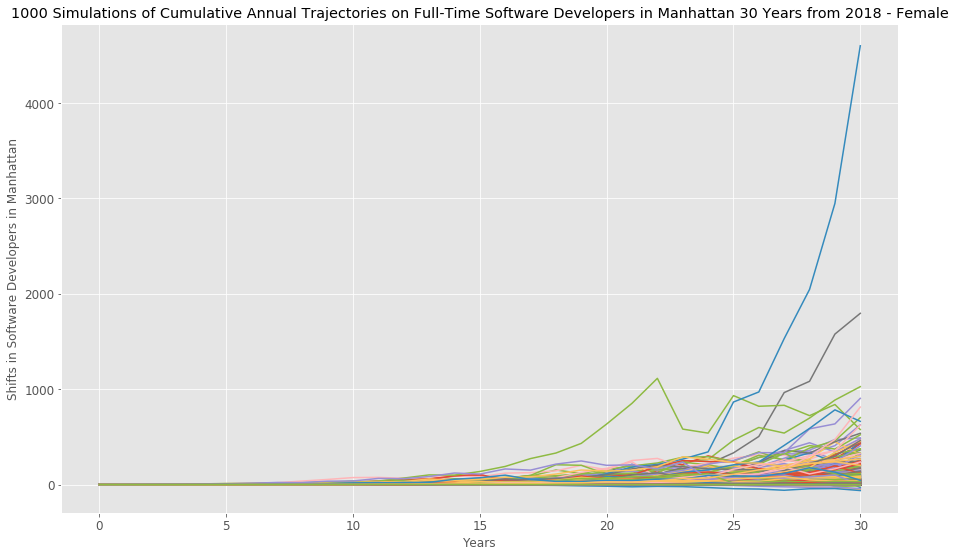

In [20]:
# Use the `plot` function to plot `1000` simulations of the potential trajectories of the employment on software developers based on a year
monte_carlo_cum_moves_software_manhattan = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Manhattan 30 Years from 2018 - Female"
software_cumulative_moves_manhattan.plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts in Software Developers in Manhattan')
plt.show()

<Figure size 432x288 with 0 Axes>

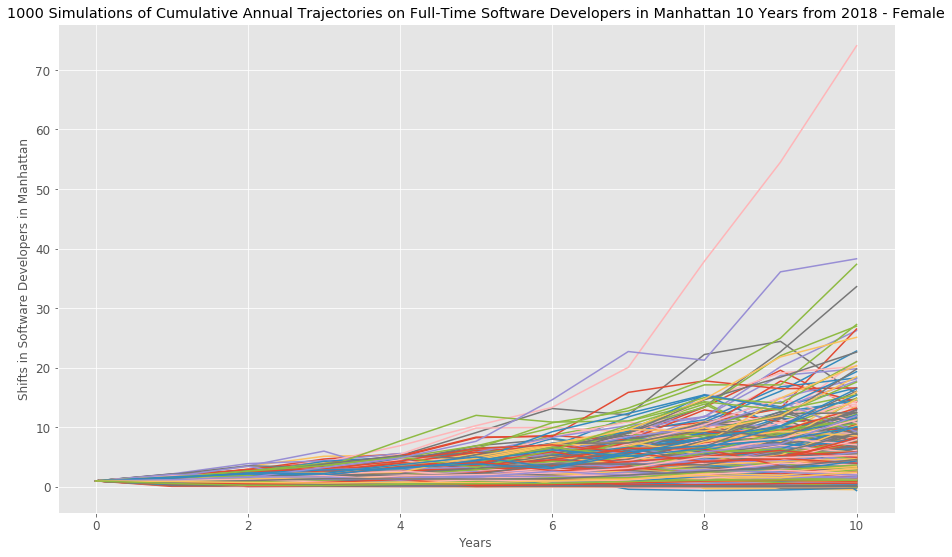

In [21]:
# Use the `plot` function to plot `1000` simulations of the potential trajectories of the employment on software developers based on a year
monte_carlo_cum_moves_software_manhattan_decade = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Manhattan 10 Years from 2018 - Female"
software_cumulative_moves_manhattan.iloc[0:11, :].plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts in Software Developers in Manhattan')
plt.show()

In [22]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
ending_software_cumulative_moves_manhattan = software_cumulative_moves_manhattan.iloc[-1, :]
ending_software_cumulative_moves_manhattan.head()

0      6.056514
1      2.530160
2      0.554152
3    434.114051
4      2.927062
Name: 30, dtype: float64

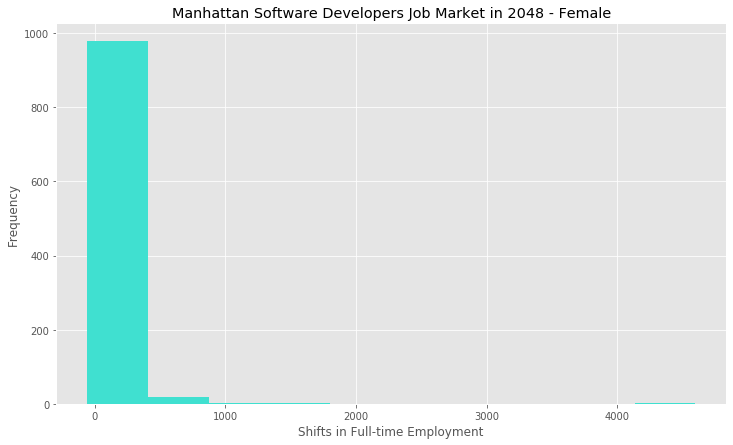

In [23]:
# Use the `plot` function to plot a frequency distribution of simulated ending prices
fig_hist_software_manhattan = plt.figure()
ending_software_cumulative_moves_manhattan.plot(kind='hist', bins=10, color = 'turquoise', 
                             title='Manhattan Software Developers Job Market in 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.show()

In [24]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative return ranges
ending_software_cumulative_moves_manhattan.value_counts(bins=10) / len(ending_software_cumulative_moves_manhattan)

(-66.738, 404.088]      0.978
(404.088, 870.252]      0.018
(870.252, 1336.415]     0.002
(4133.397, 4599.561]    0.001
(1336.415, 1802.579]    0.001
(3667.233, 4133.397]    0.000
(3201.07, 3667.233]     0.000
(2734.906, 3201.07]     0.000
(2268.742, 2734.906]    0.000
(1802.579, 2268.742]    0.000
Name: 30, dtype: float64

In [25]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
confidence_interval_software_manhattan = ending_software_cumulative_moves_manhattan.quantile(q=[0.025, 0.975])
confidence_interval_software_manhattan

0.025      0.010549
0.975    336.974078
Name: 30, dtype: float64

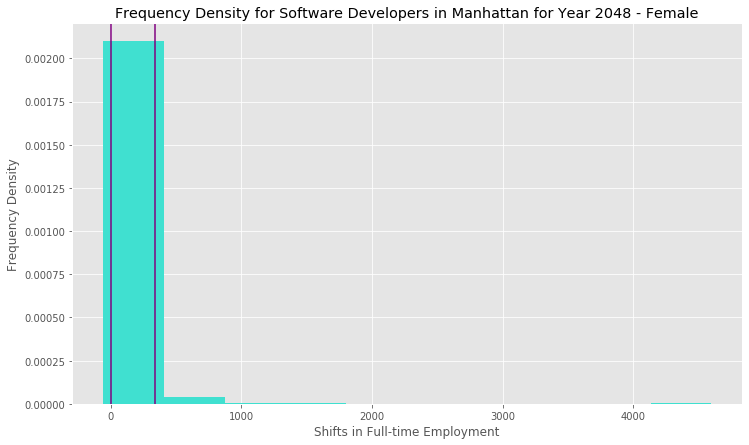

In [26]:
# Use the `plot` function to create a probability distribution histogram of simulated ending employment
# with markings for a 95% confidence interval
hist_cum_moves_software_manhattan = plt.figure()
ending_software_cumulative_moves_manhattan.plot(kind='hist', density=True, bins=10, color = 'turquoise', 
                             title='Frequency Density for Software Developers in Manhattan for Year 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(confidence_interval_software_manhattan.iloc[0], color='purple')
plt.axvline(confidence_interval_software_manhattan.iloc[1], color='purple')
plt.show()

In [27]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
tenth_software_cumulative_moves_manhattan = software_cumulative_moves_manhattan.iloc[-20, :]
tenth_software_cumulative_moves_manhattan.head()

0     2.393909
1     2.427015
2     1.971731
3    21.368475
4     2.185380
Name: 11, dtype: float64

In [28]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative return ranges
tenth_software_cumulative_moves_manhattan.value_counts(bins=10) / len(tenth_software_cumulative_moves_manhattan)

(-1.1099999999999999, 6.661]    0.813
(6.661, 14.354]                 0.131
(14.354, 22.047]                0.039
(22.047, 29.74]                 0.011
(37.433, 45.126]                0.002
(29.74, 37.433]                 0.002
(68.205, 75.898]                0.001
(60.512, 68.205]                0.001
(52.819, 60.512]                0.000
(45.126, 52.819]                0.000
Name: 11, dtype: float64

In [29]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
tenth_software_confidence_interval_manhattan = tenth_software_cumulative_moves_manhattan.quantile(q=[0.025, 0.975])
tenth_software_confidence_interval_manhattan

0.025     0.099592
0.975    19.895103
Name: 11, dtype: float64

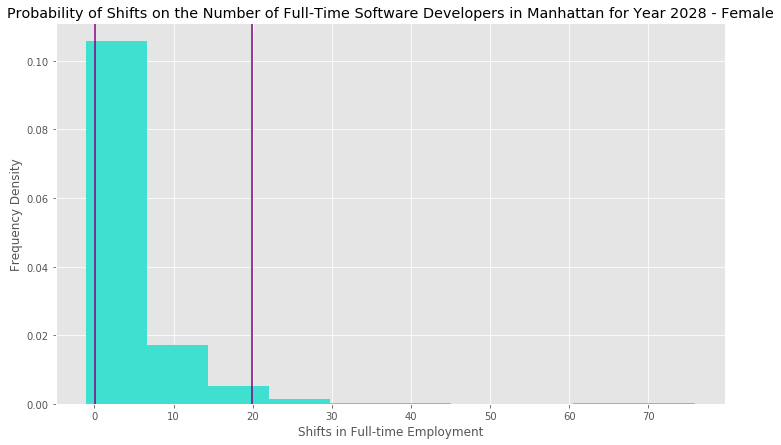

In [30]:
# Use the `plot` function to create a probability distribution histogram of simulated ending prices
# with markings for a 95% confidence interval
hist_tenth_software_cum_moves_manhattan = plt.figure()
tenth_software_cumulative_moves_manhattan.plot(kind='hist', density=True, bins=10, color = 'turquoise', 
                             title='Probability of Shifts on the Number of Full-Time Software Developers in Manhattan for Year 2028 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(tenth_software_confidence_interval_manhattan.iloc[0], color='purple')
plt.axvline(tenth_software_confidence_interval_manhattan.iloc[1], color='purple')
plt.show()

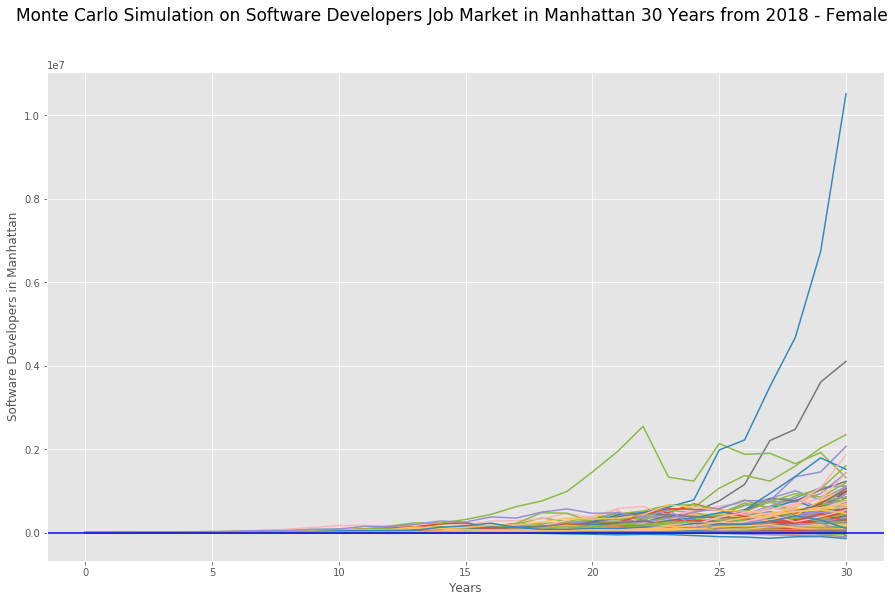

In [31]:
# Set initial employment
initial_software_manhattan = software_devops_female_last_manhattan 

fig_software_manhattan = plt.figure(figsize=(15,9))
fig_software_manhattan.suptitle('Monte Carlo Simulation on Software Developers Job Market in Manhattan 30 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_manhattan * initial_software_manhattan)
#plt.axhline(y = software_devops_male_last_manhattan, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_manhattan, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Manhattan')
plt.show()

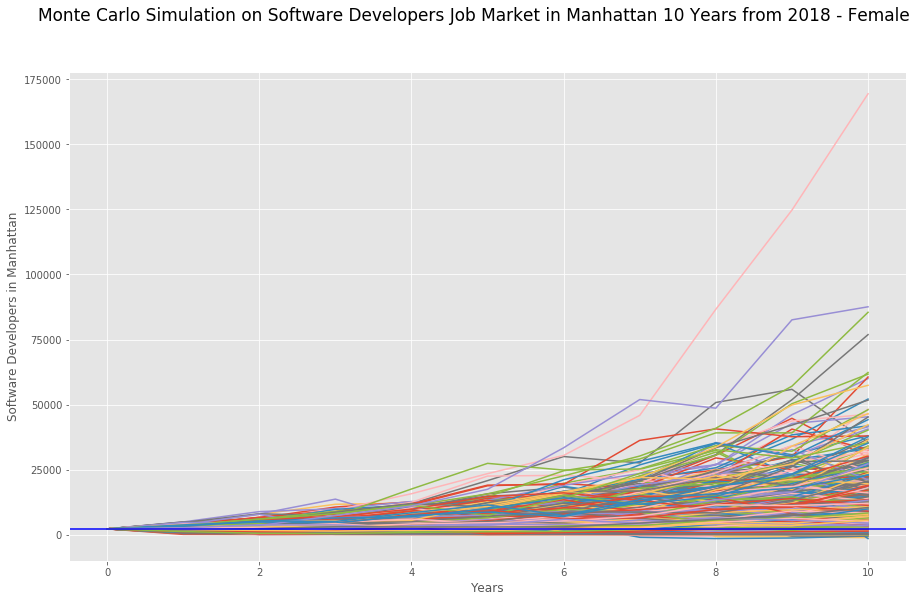

In [32]:
fig_software_manhattan_decade = plt.figure(figsize=(15,9))
fig_software_manhattan_decade.suptitle('Monte Carlo Simulation on Software Developers Job Market in Manhattan 10 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_manhattan.iloc[0:11, :] * initial_software_manhattan)
#plt.axhline(y = software_devops_male_last_manhattan, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_manhattan, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Manhattan')
plt.show()

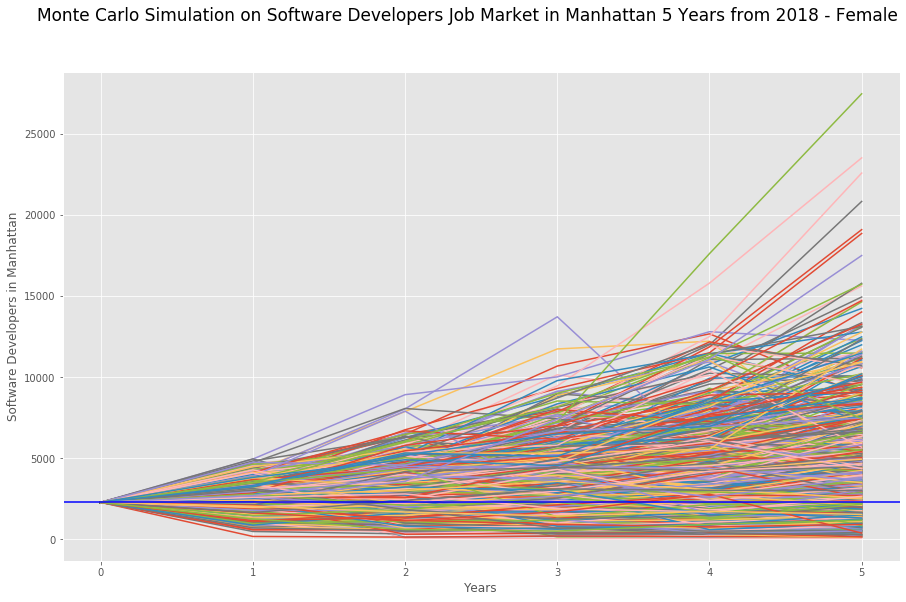

In [33]:
# In the next five years
fig_software_manhattan_decade = plt.figure(figsize=(15,9))
fig_software_manhattan_decade.suptitle('Monte Carlo Simulation on Software Developers Job Market in Manhattan 5 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_manhattan.iloc[0:6, :] * initial_software_manhattan)
# plt.axhline(y = software_devops_male_last_manhattan, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_manhattan, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Manhattan')
plt.show()

In [34]:
# Calculate investment profit/loss of lower and upper bound cumulative portfolio returns
software_gnl_lower_bound_manhattan = initial_software_manhattan * confidence_interval_software_manhattan.iloc[0]
software_gnl_upper_bound_manhattan = initial_software_manhattan * confidence_interval_software_manhattan.iloc[1]
                                                    
# Print the results
print(f"Thirty years from 2018, there is a 95% chance that an {initial_software_manhattan:,.0f}k initial employment on female software developers"
      f" in Manhattan will end up within the range of"
      f" {software_gnl_lower_bound_manhattan:,.0f}k and {software_gnl_upper_bound_manhattan:,.0f}k.")

Thirty years from 2018, there is a 95% chance that an 2,287k initial employment on female software developers in Manhattan will end up within the range of 24k and 770,660k.


In [35]:
# Calculate investment profit/loss of lower and upper bound cumulative portfolio returns
tenth_software_gnl_lower_bound_manhattan = initial_software_manhattan * tenth_software_confidence_interval_manhattan.iloc[0]
tenth_software_gnl_upper_bound_manhattan = initial_software_manhattan * tenth_software_confidence_interval_manhattan.iloc[1]
                                                    
# Print the results
print(f"There is a 95% chance that an {initial_software_manhattan:,.0f}k initial employment on female software developers"
      f" in Manhattan 2018 will end up in 2028 within the range of"
      f" {tenth_software_gnl_lower_bound_manhattan:,.0f}k and {tenth_software_gnl_upper_bound_manhattan:,.0f}k.")

There is a 95% chance that an 2,287k initial employment on female software developers in Manhattan 2018 will end up in 2028 within the range of 228k and 45,500k.


In [36]:
software_trajectories_manhattan = initial_software_manhattan * software_cumulative_moves_manhattan.quantile(q=[0.05, 0.5, 0.95], axis='columns', numeric_only=True).T
software_trajectories_manhattan.columns = ['Lower 5%', 'Median', 'Upper 5%']
software_trajectories_manhattan

,Lower 5%,Median,Upper 5%
0,2287.000000,2287.000000,2287.000000
1,1337.552117,2632.256487,3896.711865
2,1141.159919,2818.766620,5222.726012
3,892.291914,3140.239925,6787.702971
4,900.731337,3369.015943,8651.942416
5,808.954813,3648.481451,10827.592964
6,829.653303,3860.911140,13059.707536
7,748.386281,4349.383030,16486.113703
8,656.973355,4581.251402,21455.399871
9,587.763469,5004.379775,23176.144193


<Figure size 432x288 with 0 Axes>

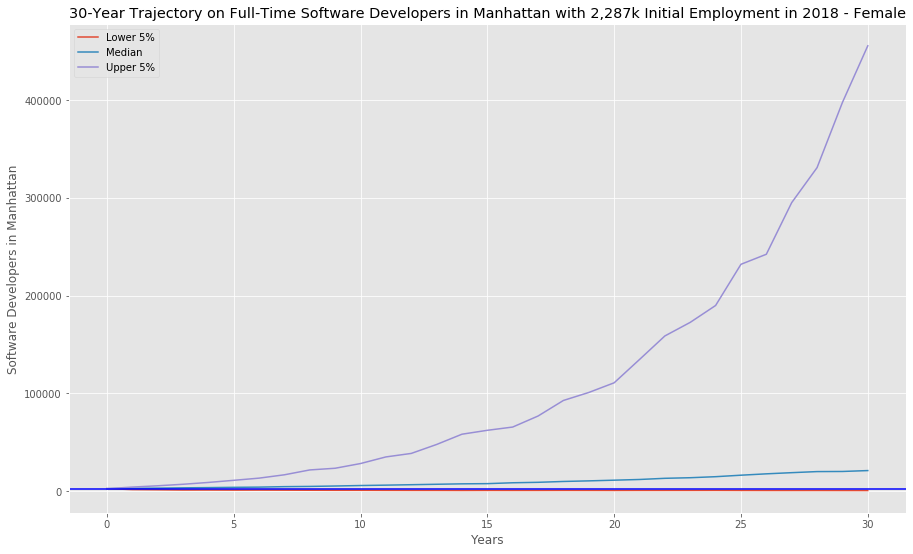

In [38]:
ax_cum_software_manhattan = plt.figure()
software_trajectories_manhattan.plot(title="30-Year Trajectory on Full-Time Software Developers in Manhattan with 2,287k Initial Employment in 2018 - Female",
                          figsize=(15, 9)),
#plt.axhline(y = software_devops_male_last_manhattan, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_manhattan, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Manhattan')
plt.show()

<Figure size 432x288 with 0 Axes>

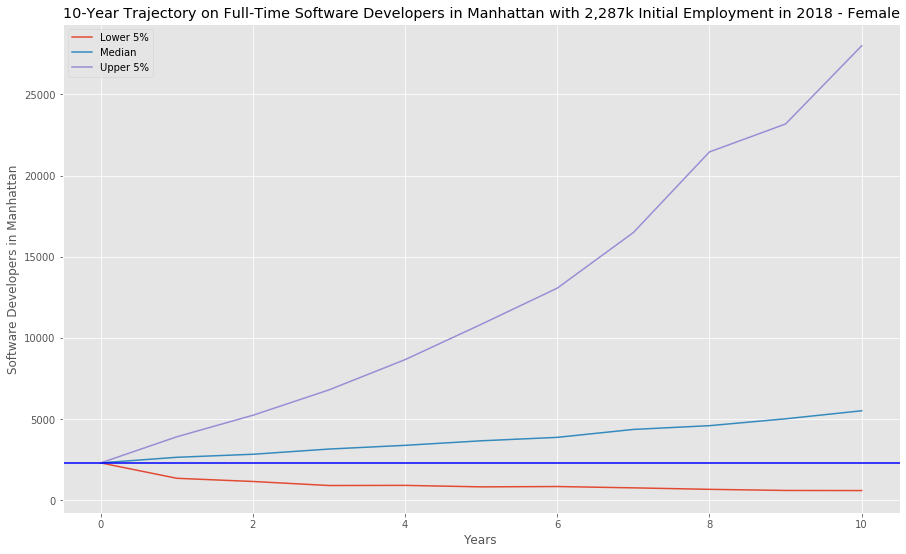

In [39]:
ax_cum_software_manhattan_decade = plt.figure()
software_trajectories_manhattan.iloc[0:11, :].plot(title="10-Year Trajectory on Full-Time Software Developers in Manhattan with 2,287k Initial Employment in 2018 - Female",
                                                   figsize=(15, 9))
#plt.axhline(y = software_devops_male_last_manhattan, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_manhattan, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Manhattan')
plt.show()

### Monte Carlo Simulation on Financial Specialists in Bronx Over 30 Years From 2018

In [40]:
software_df_bronx = software_devops_Bronx
software_df_bronx

Software_devops_male  \
County Year Name                                           
005    2010 Bronx County, New York                 430.0   
       2011 Bronx County, New York                 994.0   
       2012 Bronx County, New York                1146.0   
       2013 Bronx County, New York                 728.0   
       2014 Bronx County, New York                 417.0   
       2015 Bronx County, New York                1484.0   
       2016 Bronx County, New York                 655.0   
       2017 Bronx County, New York                 886.0   
       2018 Bronx County, New York                1655.0   

                                    Software_devops_female  
County Year Name                                            
005    2010 Bronx County, New York                   362.0  
       2011 Bronx County, New York                   182.0  
       2012 Bronx County, New York                   313.0  
       2013 Bronx County, New York                     0.0  
       2014 Bronx County, New York                   198.0  
       2015 Bronx County, New York                   370.0  
       2016 Bronx County, New York                   306.0  
       2017 Bronx County, New York                   256.0  
       2018 Bronx County, New York                   229.0

In [41]:
# Use the `pct_change` function to calculate daily returns of `male` and `female`.
annual_moves_software_bronx = software_df_bronx.pct_change().fillna(0)
annual_moves_software_bronx

Software_devops_male  \
County Year Name                                           
005    2010 Bronx County, New York              0.000000   
       2011 Bronx County, New York              1.311628   
       2012 Bronx County, New York              0.152918   
       2013 Bronx County, New York             -0.364747   
       2014 Bronx County, New York             -0.427198   
       2015 Bronx County, New York              2.558753   
       2016 Bronx County, New York             -0.558625   
       2017 Bronx County, New York              0.352672   
       2018 Bronx County, New York              0.867946   

                                    Software_devops_female  
County Year Name                                            
005    2010 Bronx County, New York                0.000000  
       2011 Bronx County, New York               -0.497238  
       2012 Bronx County, New York                0.719780  
       2013 Bronx County, New York               -1.000000  
       2014 Bronx County, New York                     inf  
       2015 Bronx County, New York                0.868687  
       2016 Bronx County, New York               -0.172973  
       2017 Bronx County, New York               -0.163399  
       2018 Bronx County, New York               -0.105469

In [42]:
annual_moves_software_bronx.replace([np.inf, -np.inf], np.nan, inplace=True)
annual_moves_software_bronx.fillna(0)

Software_devops_male  \
County Year Name                                           
005    2010 Bronx County, New York              0.000000   
       2011 Bronx County, New York              1.311628   
       2012 Bronx County, New York              0.152918   
       2013 Bronx County, New York             -0.364747   
       2014 Bronx County, New York             -0.427198   
       2015 Bronx County, New York              2.558753   
       2016 Bronx County, New York             -0.558625   
       2017 Bronx County, New York              0.352672   
       2018 Bronx County, New York              0.867946   

                                    Software_devops_female  
County Year Name                                            
005    2010 Bronx County, New York                0.000000  
       2011 Bronx County, New York               -0.497238  
       2012 Bronx County, New York                0.719780  
       2013 Bronx County, New York               -1.000000  
       2014 Bronx County, New York                0.000000  
       2015 Bronx County, New York                0.868687  
       2016 Bronx County, New York               -0.172973  
       2017 Bronx County, New York               -0.163399  
       2018 Bronx County, New York               -0.105469

In [43]:
# Use the `mean` function to calculate the mean of market shifts for `male` and `female`, respectively
avg_annual_moves_software_devops_male_bronx = annual_moves_software_bronx.mean()['Software_devops_male']
avg_annual_moves_software_devops_female_bronx = annual_moves_software_bronx.mean()['Software_devops_female']
avg_annual_moves_software_devops_male_bronx

0.4325939893597773

In [44]:
avg_annual_moves_software_devops_female_bronx

-0.04382636204713941

In [45]:
# Use the `std` function to calculate the standard deviation of market moves for `male` and `female`, respectively
std_dev_annual_moves_software_devops_male_bronx = annual_moves_software_bronx.std()['Software_devops_male']
std_dev_annual_moves_software_devops_female_bronx = annual_moves_software_bronx.std()['Software_devops_female']
std_dev_annual_moves_software_devops_male_bronx

1.006978045945634

In [46]:
std_dev_annual_moves_software_devops_female_bronx

0.6061968185848633

In [47]:
# Set number of simulations and trading days
num_simulations = 1000
num_years = 30

# Set last employment figures of `Software_devops_male` and `Software_devops_female`
software_devops_male_last_bronx = software_df_bronx['Software_devops_male'][-1]
software_devops_female_last_bronx = software_df_bronx['Software_devops_female'][-1]

# Initialize empty DataFrame to hold simulated employment data for each simulation
simulated_software_df_bronx = pd.DataFrame()
software_cumulative_moves_bronx = pd.DataFrame()

# Run the simulation of projecting employment for the next 30 years, `1000` times
for n in range(num_simulations):
    
    count = 0
    
    simulated_software_devop_male_bronx = []
    simulated_software_devop_female_bronx = []

    # Initialize the simulated prices list with the last employmentdata of `Software_devops_male` and `Software_devops_female`
    simulated_software_devops_male_bronx = [software_devops_male_last_bronx]
    simulated_software_devops_female_bronx = [software_devops_female_last_bronx]
      
    # Simulate the returns for 30 years
    for i in range(num_years):
        
        if count == 30:
            break
            
        simulated_software_devop_male_bronx = simulated_software_devops_male_bronx[count] * (1 + np.random.normal(avg_annual_moves_software_devops_male_bronx, std_dev_annual_moves_software_devops_male_bronx))
        simulated_software_devop_female_bronx = simulated_software_devops_female_bronx[count] * (1 + np.random.normal(avg_annual_moves_software_devops_female_bronx, std_dev_annual_moves_software_devops_female_bronx))

        simulated_software_devops_male_bronx.append(simulated_software_devop_male_bronx)
        simulated_software_devops_female_bronx.append(simulated_software_devop_female_bronx)
        
        count += 1
            
    # Append a simulated prices of each simulation to DataFrame
    simulated_software_df_bronx['Software_devops_male'] = simulated_software_devops_male_bronx
    simulated_software_df_bronx['Software_devops_female'] = simulated_software_devops_female_bronx
    
    # Calculate the daily returns of simulated prices
    simulated_software_moves_bronx = simulated_software_df_bronx.pct_change()
    
    # Set the portfolio weights (0% male; 100% female)
    weights = [0.0, 1.0]

    # Use the `dot` function with the weights to multiply weights with each column's simulated daily returns
    software_annual_moves_bronx = simulated_software_moves_bronx.dot(weights)
    
    # Calculate the normalized, cumulative return series
    software_cumulative_moves_bronx[n] = (1 + software_annual_moves_bronx.fillna(0)).cumprod()

# Print records from the DataFrame
software_cumulative_moves_bronx

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000e+00,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,...,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000
1,1.557222,1.729937e+00,1.555516,1.341595e-01,0.630113,0.415063,0.744874,1.265704,1.955918,4.726400e-01,...,0.070157,0.713404,9.830894e-01,1.371443,1.227240,0.726182,1.150047,1.689033e+00,1.462789,1.626511
2,2.306582,2.147015e+00,1.750096,1.573941e-01,0.131318,0.034585,1.121565,1.741660,2.243110,4.869952e-01,...,0.090837,0.211486,3.651955e-01,0.865046,1.700408,1.435486,1.850618,6.366554e-01,1.017152,0.858102
3,1.563120,1.148427e+00,2.824881,1.609298e-01,0.165261,0.057005,0.488863,1.173032,3.373516,3.073503e-01,...,0.110401,0.241826,4.161447e-01,0.028792,2.651420,1.220022,3.282568,4.470131e-01,1.833306,0.443824
4,0.458698,1.763115e+00,5.086702,2.788460e-01,0.271582,0.029965,0.532735,1.522630,5.770721,2.933840e-01,...,0.241734,0.243479,3.742628e-01,0.013884,5.122216,0.381438,6.134537,1.634553e-01,1.946977,0.307589
5,0.422615,-1.081366e-01,0.503451,1.426967e-01,0.061548,0.019452,0.511581,0.766274,-1.667934,-8.783947e-03,...,0.273369,0.064807,1.820871e-01,0.015856,8.632574,0.443406,6.693289,1.080112e-01,0.849557,0.528107
6,0.439184,-1.620447e-02,0.822232,9.466394e-02,0.024448,0.019580,0.976136,0.121315,-1.366854,-6.892302e-03,...,0.002099,0.023216,2.408170e-02,0.001841,6.451303,0.513005,3.685384,1.293593e-01,-0.083005,0.424102
7,0.511014,-2.169269e-02,1.558930,7.712417e-02,0.015760,-0.000816,0.621844,0.031412,-2.265785,-3.999545e-03,...,0.001015,-0.004300,7.501237e-03,0.002538,2.320353,0.497055,-0.127387,1.146567e-01,-0.043183,0.241905
8,0.319972,-1.694062e-02,1.702874,1.312727e-01,0.008663,-0.000920,0.833564,0.028183,-0.968299,-2.114648e-03,...,0.000845,-0.004471,9.890525e-03,0.004109,2.817835,0.529167,-0.201421,5.587011e-02,-0.065660,0.062614
9,0.200669,-1.273161e-02,2.121203,1.100727e-01,0.014972,-0.000394,1.060308,0.017093,-1.807457,-1.550794e-03,...,0.000410,-0.010088,9.873732e-03,-0.005074,3.849266,0.434169,-0.120043,1.045155e-01,-0.098543,0.040844


<Figure size 432x288 with 0 Axes>

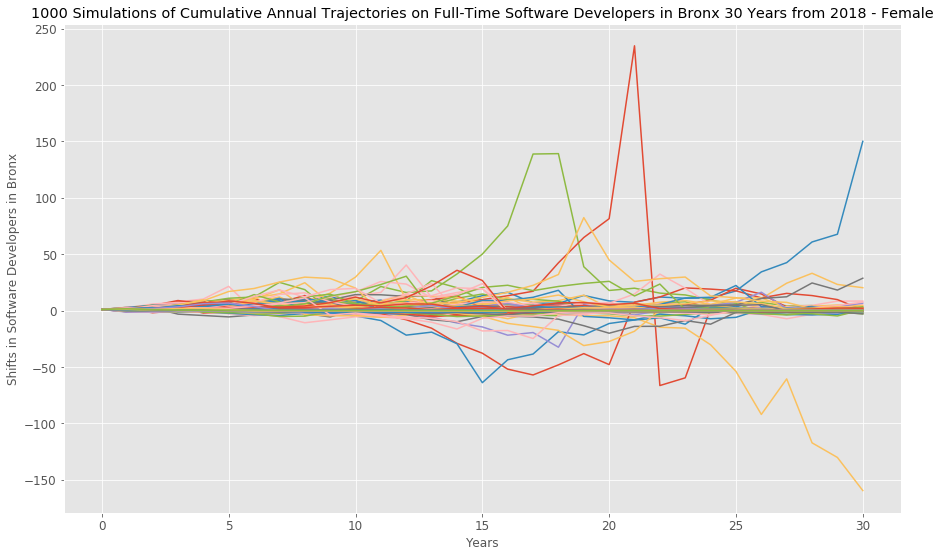

In [48]:
# Use the `plot` function to plot `1000` simulations of the potential trajectories of the employment on software developers based on a year
monte_carlo_cum_moves_software_bronx = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Bronx 30 Years from 2018 - Female"
software_cumulative_moves_bronx.plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts in Software Developers in Bronx')
plt.show()

<Figure size 432x288 with 0 Axes>

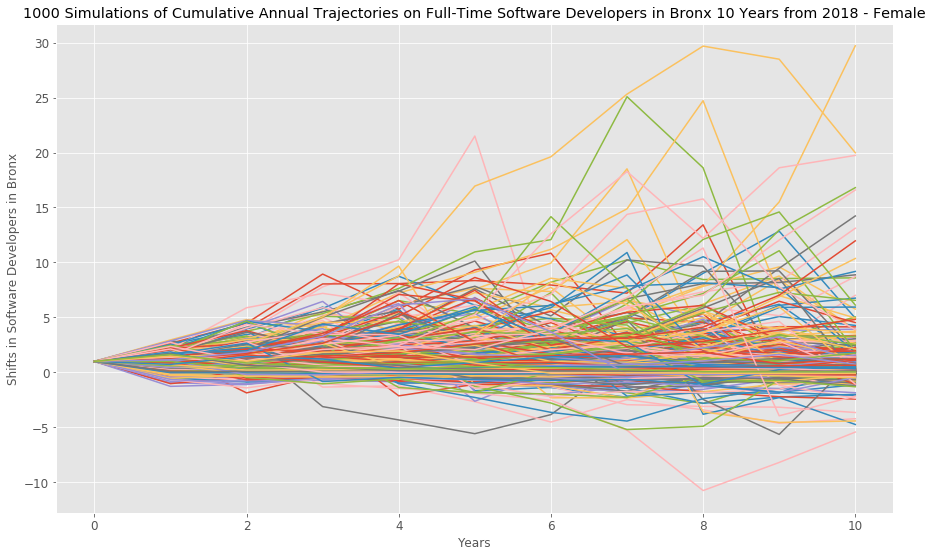

In [49]:
# Trajectory for the next 10 years
monte_carlo_cum_moves_software_bronx_decade = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Bronx 10 Years from 2018 - Female"
software_cumulative_moves_bronx.iloc[0:11, :].plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts in Software Developers in Bronx')
plt.show()

In [50]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
ending_software_cumulative_moves_bronx = software_cumulative_moves_bronx.iloc[-1, :]
ending_software_cumulative_moves_bronx.head()

0   -5.365127e-03
1    6.234904e-07
2    7.938875e-01
3   -4.988801e-07
4   -8.687147e-03
Name: 30, dtype: float64

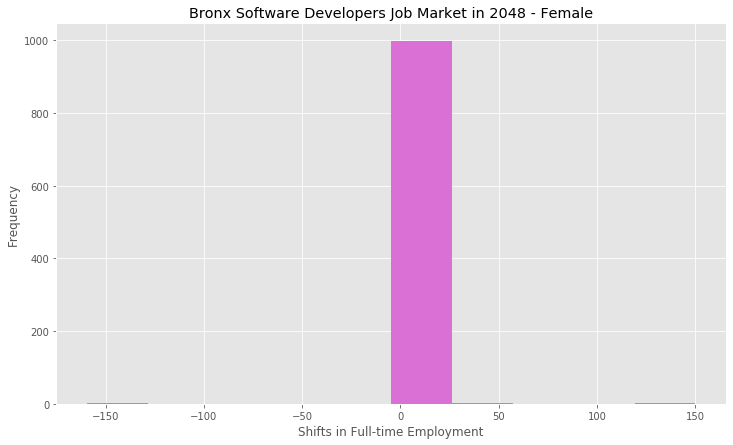

In [51]:
# Use the `plot` function to plot a frequency distribution of simulated ending prices
fig_hist_software_bronx = plt.figure()
ending_software_cumulative_moves_bronx.plot(kind='hist', bins=10, color = 'orchid', 
                             title='Bronx Software Developers Job Market in 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.show()

In [52]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
confidence_interval_software_bronx = ending_software_cumulative_moves_bronx.quantile(q=[0.025, 0.975])
confidence_interval_software_bronx

0.025   -0.184093
0.975    0.445264
Name: 30, dtype: float64

In [53]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative moves ranges
ending_software_cumulative_moves_bronx.value_counts(bins=10) / len(ending_software_cumulative_moves_bronx)

(-4.738, 26.223]        0.997
(119.105, 150.066]      0.001
(26.223, 57.184]        0.001
(-159.852, -128.581]    0.001
(88.145, 119.105]       0.000
(57.184, 88.145]        0.000
(-35.699, -4.738]       0.000
(-66.659, -35.699]      0.000
(-97.62, -66.659]       0.000
(-128.581, -97.62]      0.000
Name: 30, dtype: float64

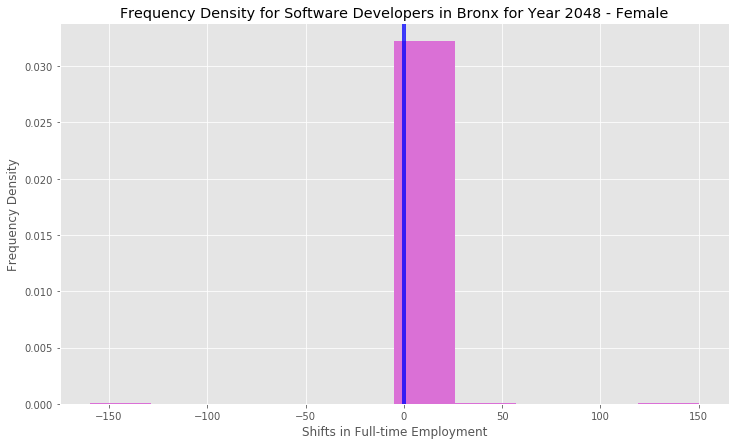

In [54]:
# Use the `plot` function to create a probability distribution histogram of simulated ending employment
# with markings for a 95% confidence interval
hist_cum_moves_software_bronx = plt.figure()
ending_software_cumulative_moves_bronx.plot(kind='hist', density=True, bins=10, color = 'orchid', 
                             title='Frequency Density for Software Developers in Bronx for Year 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(confidence_interval_software_bronx.iloc[0], color='blue')
plt.axvline(confidence_interval_software_bronx.iloc[1], color='blue')
plt.show()

In [55]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
tenth_software_cumulative_moves_bronx = software_cumulative_moves_bronx.iloc[-20, :]
tenth_software_cumulative_moves_bronx.head()

0   -0.024560
1   -0.000155
2    1.946123
3    0.019294
4    0.039864
Name: 11, dtype: float64

In [56]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
tenth_software_confidence_interval_bronx = tenth_software_cumulative_moves_bronx.quantile(q=[0.025, 0.975])
tenth_software_confidence_interval_bronx

0.025   -0.850979
0.975    4.190146
Name: 11, dtype: float64

In [57]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative moves ranges
tenth_software_cumulative_moves_bronx.value_counts(bins=10) / len(tenth_software_cumulative_moves_bronx)

(-2.558, 3.664]                 0.965
(3.664, 9.885]                  0.021
(-8.841999999999999, -2.558]    0.008
(22.328, 28.55]                 0.002
(16.107, 22.328]                0.002
(47.214, 53.436]                0.001
(9.885, 16.107]                 0.001
(40.993, 47.214]                0.000
(34.771, 40.993]                0.000
(28.55, 34.771]                 0.000
Name: 11, dtype: float64

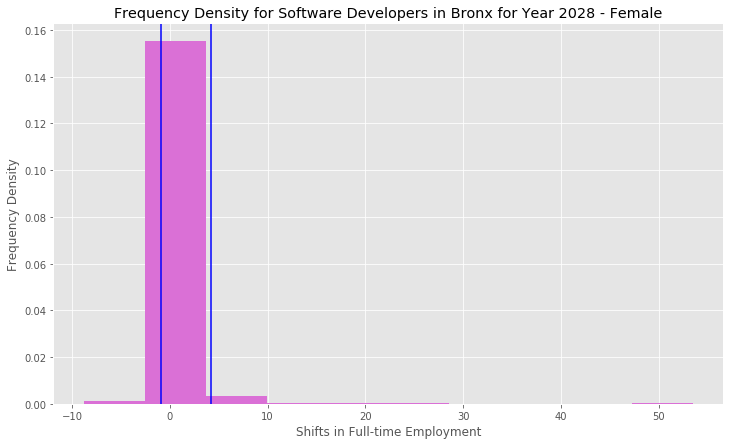

In [58]:
# Use the `plot` function to create a probability distribution histogram of simulated ending employment
# with markings for a 95% confidence interval
hist_tenth_software_cum_moves_bronx = plt.figure()
tenth_software_cumulative_moves_bronx.plot(kind='hist', density=True, bins=10, color = 'orchid', 
                             title='Frequency Density for Software Developers in Bronx for Year 2028 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(tenth_software_confidence_interval_bronx.iloc[0], color='blue')
plt.axvline(tenth_software_confidence_interval_bronx.iloc[1], color='blue')
plt.show()

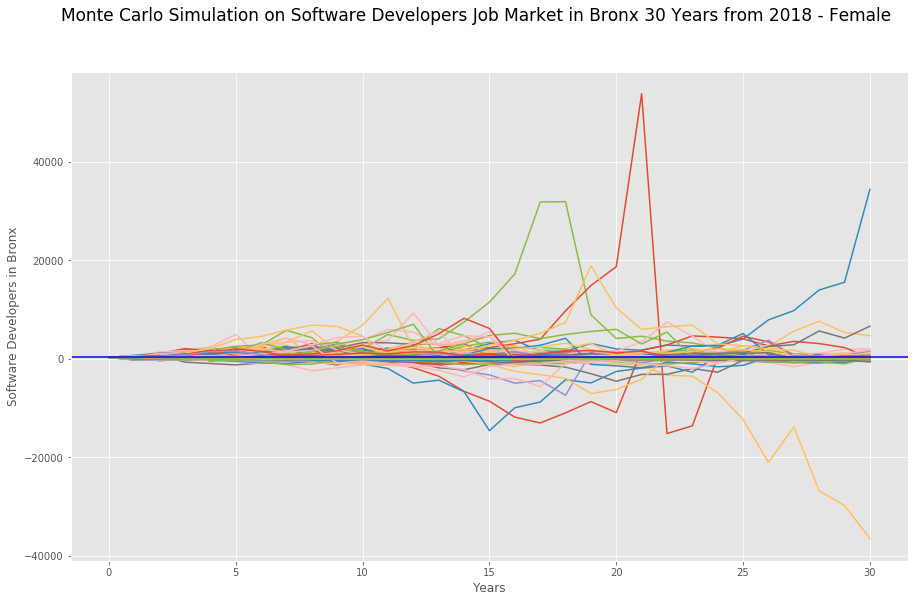

In [59]:
# Set initial employment
initial_software_bronx = software_devops_female_last_bronx 

fig_software_bronx = plt.figure(figsize=(15,9))
fig_software_bronx.suptitle('Monte Carlo Simulation on Software Developers Job Market in Bronx 30 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_bronx * initial_software_bronx)
#plt.axhline(y = software_devops_male_last_bronx, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_bronx, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Bronx')
plt.show()

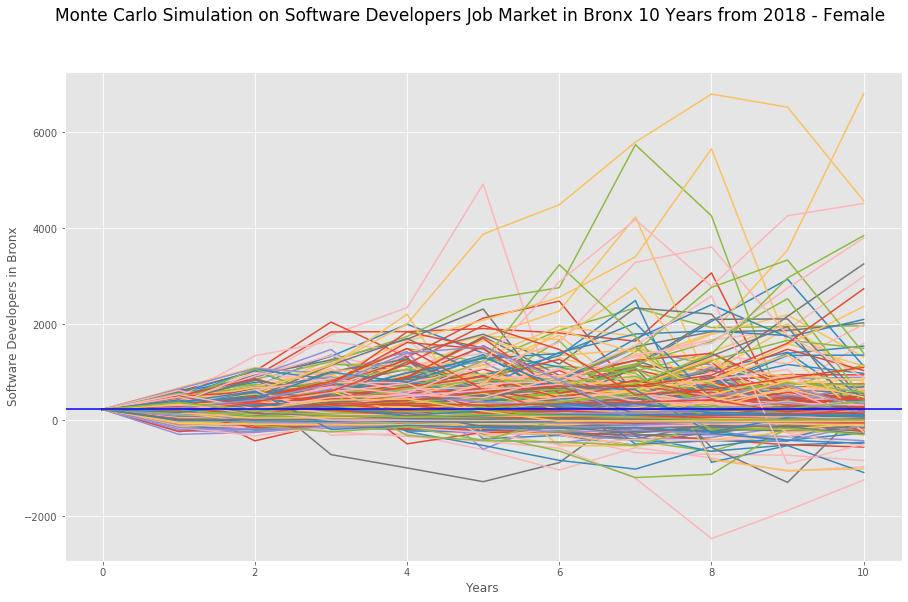

In [60]:
# Zoon in 10-year trajectories
fig_software_bronx = plt.figure(figsize=(15,9))
fig_software_bronx.suptitle('Monte Carlo Simulation on Software Developers Job Market in Bronx 10 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_bronx.iloc[0:11, :] * initial_software_bronx)
#plt.axhline(y = software_devops_male_last_bronx, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_bronx, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Bronx')
plt.show()

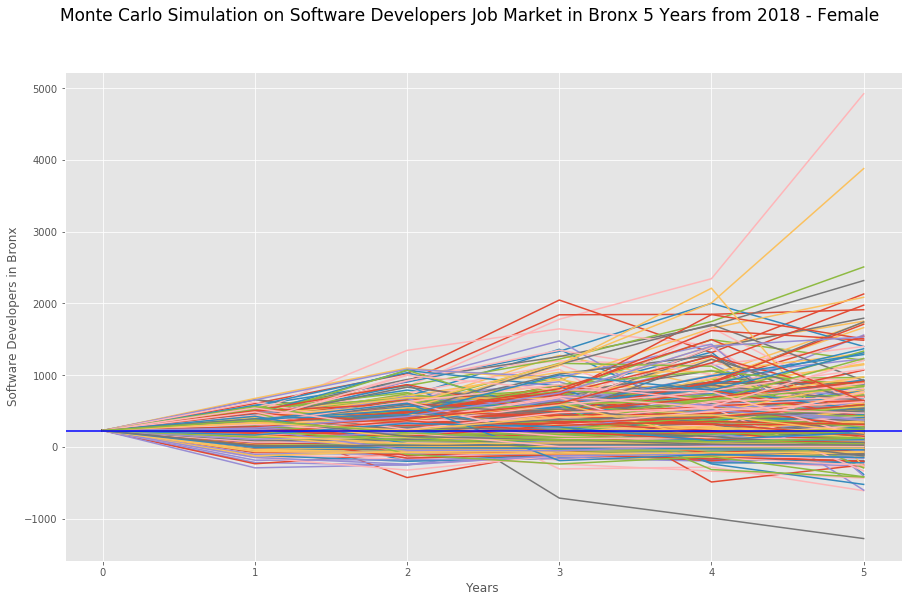

In [61]:
# Zoon in 5-year trajectories due to high volatilities
fig_software_bronx = plt.figure(figsize=(15,9))
fig_software_bronx.suptitle('Monte Carlo Simulation on Software Developers Job Market in Bronx 5 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_bronx.iloc[0:6, :] * initial_software_bronx)
#plt.axhline(y = software_devops_male_last_bronx, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_bronx, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Bronx')
plt.show()

In [62]:
# Calculate employment gains/drops of lower and upper bound cumulative county moves
software_gnl_lower_bound_bronx = initial_software_bronx * confidence_interval_software_bronx.iloc[0]
software_gnl_upper_bound_bronx = initial_software_bronx * confidence_interval_software_bronx.iloc[1]
                                                    
# Print the results
print(f"There is a 95% chance that an initial employment of {initial_software_bronx:,.0f}k in female software developers"
      f" in Bronx over the next 30 years will end within in the range of"
      f" {software_gnl_lower_bound_bronx:,.0f}k and {software_gnl_upper_bound_bronx:,.0f}k.")

There is a 95% chance that an initial employment of 229k in female software developers in Bronx over the next 30 years will end within in the range of -42k and 102k.


In [64]:
# Confidence interval in a decade
tenth_software_gnl_lower_bound_bronx = initial_software_bronx * tenth_software_confidence_interval_bronx.iloc[0]
tenth_software_gnl_upper_bound_bronx = initial_software_bronx * tenth_software_confidence_interval_bronx.iloc[1]
                                                    
# Print the results
print(f"There is a 95% chance that an initial employment of {initial_software_bronx:,.0f}k on female software developers"
      f" in Bronx will end within in the range of"
      f" {tenth_software_gnl_lower_bound_bronx:,.0f}k and {tenth_software_gnl_upper_bound_bronx:,.0f}k over the next 10 years .")

There is a 95% chance that an initial employment of 229k on female software developers in Bronx will end within in the range of -195k and 960k over the next 10 years .


In [65]:
software_trajectories_bronx = initial_software_bronx * software_cumulative_moves_bronx.quantile(q=[0.05, 0.5, 0.95], axis='columns', numeric_only=True).T
software_trajectories_bronx.columns = ['Lower 5%', 'Median', 'Upper 5%']
software_trajectories_bronx

,Lower 5%,Median,Upper 5%
0,229.000000,229.000000,229.000000
1,-5.850817,225.445769,447.840984
2,-31.808458,175.005459,610.471305
3,-51.113739,117.223553,723.120495
4,-72.849708,74.294866,849.390354
5,-65.163909,52.353975,879.693876
6,-71.825021,31.278198,778.704861
7,-72.926697,17.435136,769.537000
8,-77.264308,8.770085,838.248874
9,-76.498980,4.645711,664.243601


<Figure size 432x288 with 0 Axes>

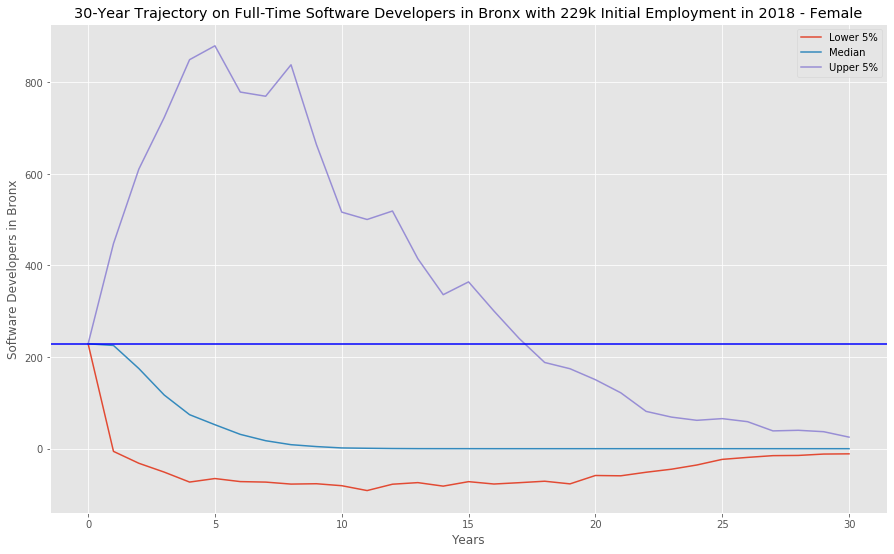

In [67]:
ax_cum_software_bronx = plt.figure()
software_trajectories_bronx.plot(title="30-Year Trajectory on Full-Time Software Developers in Bronx with 229k Initial Employment in 2018 - Female",
                          figsize=(15, 9)),
#plt.axhline(y = software_devops_male_last_bronx, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_bronx, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Bronx')
plt.show()

<Figure size 432x288 with 0 Axes>

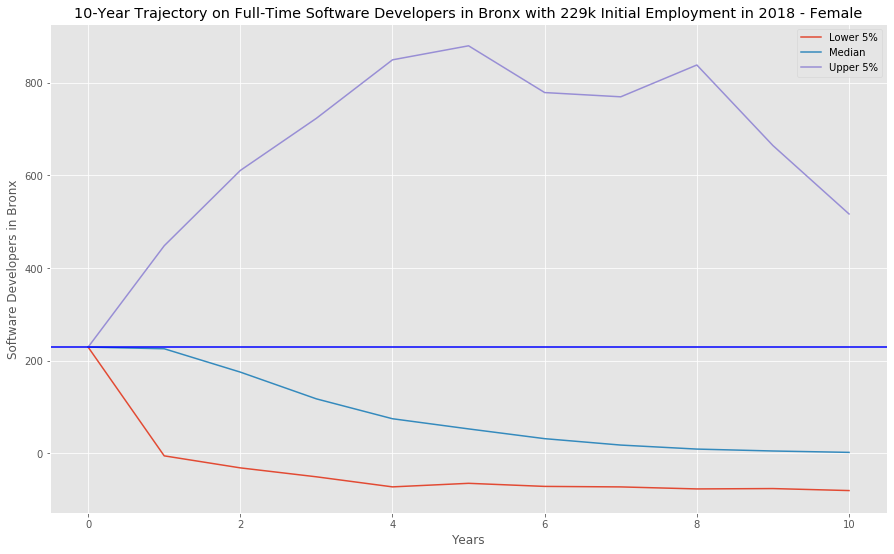

In [68]:
ax_cum_software_bronx_decade = plt.figure()
software_trajectories_bronx.iloc[0:11, :].plot(title="10-Year Trajectory on Full-Time Software Developers in Bronx with 229k Initial Employment in 2018 - Female",
                          figsize=(15, 9)),
#plt.axhline(y = software_devops_male_last_bronx, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_bronx, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Bronx')
plt.show()

<Figure size 432x288 with 0 Axes>

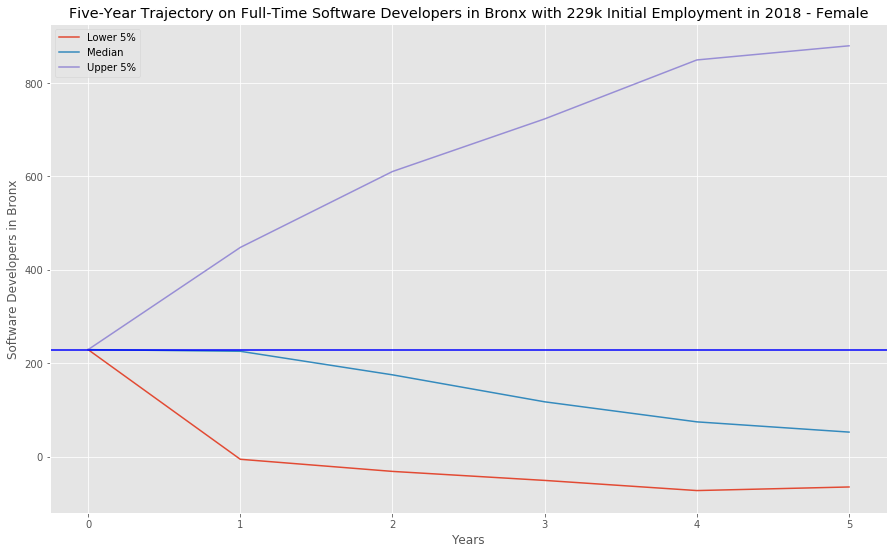

In [69]:
ax_cum_software_bronx_five = plt.figure()
software_trajectories_bronx.iloc[0:6, :].plot(title="Five-Year Trajectory on Full-Time Software Developers in Bronx with 229k Initial Employment in 2018 - Female",
                          figsize=(15, 9)),
#plt.axhline(y = software_devops_male_last_bronx, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_bronx, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Bronx')
plt.show()

### Monte Carlo Simulation on Full-Time Financial Specialists in Brooklyn Over 30 Years Starting from 2018

In [70]:
software_df_brooklyn = software_devops_Brooklyn
software_df_brooklyn

Software_devops_male  \
County Year Name                                           
047    2010 Kings County, New York                9372.0   
       2011 Kings County, New York                9963.0   
       2012 Kings County, New York                9372.0   
       2013 Kings County, New York                9112.0   
       2014 Kings County, New York               10016.0   
       2015 Kings County, New York               10376.0   
       2016 Kings County, New York               12250.0   
       2017 Kings County, New York               12181.0   
       2018 Kings County, New York               13841.0   

                                    Software_devops_female  
County Year Name                                            
047    2010 Kings County, New York                  2111.0  
       2011 Kings County, New York                  2526.0  
       2012 Kings County, New York                  2676.0  
       2013 Kings County, New York                  2744.0  
       2014 Kings County, New York                  2549.0  
       2015 Kings County, New York                  3114.0  
       2016 Kings County, New York                  2856.0  
       2017 Kings County, New York                  3866.0  
       2018 Kings County, New York                  3085.0

In [71]:
# Use the `pct_change` function to calculate daily returns of `male` and `female`.
annual_moves_software_brooklyn = software_df_brooklyn.pct_change().fillna(0)
annual_moves_software_brooklyn

Software_devops_male  \
County Year Name                                           
047    2010 Kings County, New York              0.000000   
       2011 Kings County, New York              0.063060   
       2012 Kings County, New York             -0.059319   
       2013 Kings County, New York             -0.027742   
       2014 Kings County, New York              0.099210   
       2015 Kings County, New York              0.035942   
       2016 Kings County, New York              0.180609   
       2017 Kings County, New York             -0.005633   
       2018 Kings County, New York              0.136278   

                                    Software_devops_female  
County Year Name                                            
047    2010 Kings County, New York                0.000000  
       2011 Kings County, New York                0.196589  
       2012 Kings County, New York                0.059382  
       2013 Kings County, New York                0.025411  
       2014 Kings County, New York               -0.071064  
       2015 Kings County, New York                0.221656  
       2016 Kings County, New York               -0.082852  
       2017 Kings County, New York                0.353641  
       2018 Kings County, New York               -0.202018

In [72]:
# Use the `mean` function to calculate the mean of market shifts for `male` and `female`, respectively
avg_annual_moves_software_devops_male_brooklyn = annual_moves_software_brooklyn.mean()['Software_devops_male']
avg_annual_moves_software_devops_female_brooklyn = annual_moves_software_brooklyn.mean()['Software_devops_female']
avg_annual_moves_software_devops_male_brooklyn

0.04693389623259123

In [73]:
avg_annual_moves_software_devops_female_brooklyn

0.055638491010529104

In [74]:
# Use the `std` function to calculate the standard deviation of market moves for `male` and `female`, respectively
std_dev_annual_moves_software_devops_male_brooklyn = annual_moves_software_brooklyn.std()['Software_devops_male']
std_dev_annual_moves_software_devops_female_brooklyn = annual_moves_software_brooklyn.std()['Software_devops_female']
std_dev_annual_moves_software_devops_male_brooklyn

0.07968482451736368

In [75]:
std_dev_annual_moves_software_devops_female_brooklyn

0.17388129752725162

In [76]:
# Set number of simulations and trading days
num_simulations = 1000
num_years = 30

# Set last employment figures of `Software_devops_male` and `Software_devops_female`
software_devops_male_last_brooklyn  = software_df_brooklyn['Software_devops_male'][-1]
software_devops_female_last_brooklyn = software_df_brooklyn['Software_devops_female'][-1]

# Initialize empty DataFrame to hold simulated employment data for each simulation
simulated_software_df_brooklyn = pd.DataFrame()
software_cumulative_moves_brooklyn = pd.DataFrame()

# Run the simulation of projecting employment for the next 30 years, `1000` times
for n in range(num_simulations):
    
    count = 0
    
    simulated_software_devop_male_brooklyn = []
    simulated_software_devop_female_brooklyn = []

    # Initialize the simulated prices list with the last employmentdata of `Software_devops_male` and `Software_devops_female`
    simulated_software_devops_male_brooklyn = [software_devops_male_last_brooklyn]
    simulated_software_devops_female_brooklyn = [software_devops_female_last_brooklyn]
    
    # Simulate the returns for 30 years
    for i in range(num_years):
        
        if count == 30:
            break
            
        simulated_software_devop_male_brooklyn = simulated_software_devops_male_brooklyn[count] * (1 + np.random.normal(avg_annual_moves_software_devops_male_brooklyn, std_dev_annual_moves_software_devops_male_brooklyn))
        simulated_software_devop_female_brooklyn = simulated_software_devops_female_brooklyn[count] * (1 + np.random.normal(avg_annual_moves_software_devops_female_brooklyn, std_dev_annual_moves_software_devops_female_brooklyn))

        simulated_software_devops_male_brooklyn.append(simulated_software_devop_male_brooklyn)
        simulated_software_devops_female_brooklyn.append(simulated_software_devop_female_brooklyn)
        
        count += 1
            
    # Append a simulated prices of each simulation to DataFrame
    simulated_software_df_brooklyn['Software_devops_male'] = simulated_software_devops_male_brooklyn
    simulated_software_df_brooklyn['Software_devops_female'] = simulated_software_devops_female_brooklyn
    
    # Calculate the daily returns of simulated prices
    simulated_software_moves_brooklyn = simulated_software_df_brooklyn.pct_change()
    
    # Set the portfolio weights (0% male; 100% female)
    weights = [0.0, 1.0]

    # Use the `dot` function with the weights to multiply weights with each column's simulated daily returns
    software_annual_moves_brooklyn = simulated_software_moves_brooklyn.dot(weights)
    
    # Calculate the normalized, cumulative return series
    software_cumulative_moves_brooklyn[n] = (1 + software_annual_moves_brooklyn.fillna(0)).cumprod()

# Print records from the DataFrame
software_cumulative_moves_brooklyn

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.175670,1.257557,1.111616,1.022196,0.919008,1.154618,0.970867,1.303985,0.937537,1.020059,...,1.004094,1.012619,1.035788,0.989138,1.043019,1.165853,1.210394,1.164487,1.142048,1.273896
2,1.479146,1.582775,1.083143,1.109174,0.761326,1.315743,0.902402,1.233787,0.925772,0.852004,...,0.817223,0.843267,1.128719,1.414991,1.069849,1.241031,1.120336,1.208348,1.164508,1.237998
3,1.937522,1.474413,1.632671,1.253363,0.864737,1.300329,1.094506,1.027013,1.167231,1.105613,...,0.602253,1.056028,1.395159,0.760626,0.898548,1.409606,1.484112,1.032748,1.392723,1.541218
4,1.958260,1.039306,1.818420,1.272877,1.061796,1.287099,1.310969,1.090444,1.360683,1.343927,...,0.557550,0.772097,1.254613,1.082852,0.930704,1.708881,1.501741,1.319814,1.449307,1.775602
5,2.235443,1.166183,2.067490,1.250155,1.009280,0.987121,1.316978,0.956386,1.419215,1.419377,...,0.486144,0.863089,1.703946,1.025429,0.831642,2.276620,1.428047,1.245474,1.404583,2.226909
6,2.008843,1.677048,2.737542,0.977931,1.079574,1.033895,1.880919,1.175321,1.785317,1.734491,...,0.486954,0.868771,1.235521,0.838811,0.906061,2.094549,1.878605,1.200564,1.093763,2.955380
7,2.263211,1.871319,3.360602,1.102964,1.173673,1.051652,2.434289,1.222994,1.504262,2.036389,...,0.448560,0.884427,1.348508,0.839348,0.844065,2.076298,2.107007,1.281517,0.795648,2.995675
8,2.604265,2.054048,3.240273,1.164950,1.046844,0.660248,3.345645,1.093900,1.762436,2.111662,...,0.433208,0.892435,1.543735,0.825037,0.749287,2.670634,2.062709,1.515692,0.875058,3.650656
9,2.823395,2.246594,2.510129,1.227897,1.194392,0.683632,3.903817,1.232311,1.940814,1.996939,...,0.608257,1.004588,1.213858,0.527752,0.888219,2.903300,2.217576,1.230753,1.167215,4.448827


<Figure size 432x288 with 0 Axes>

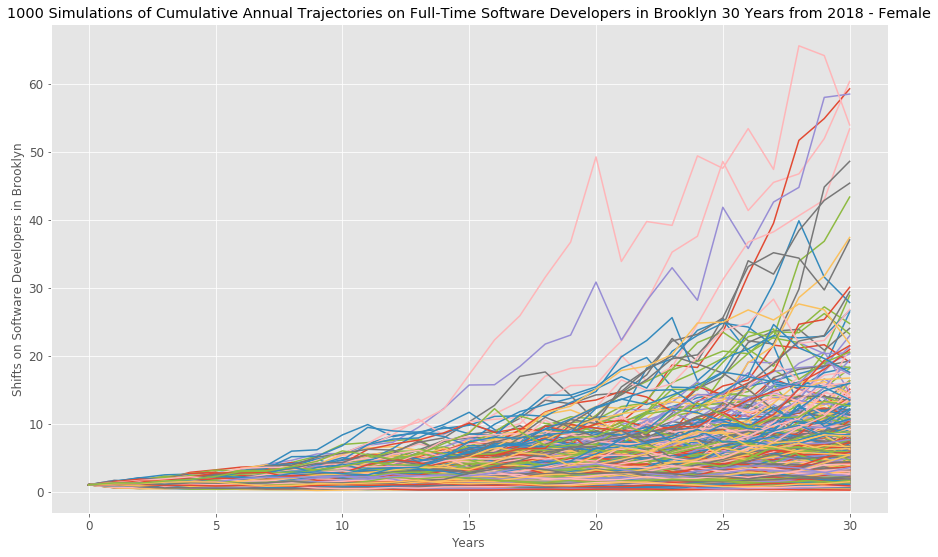

In [77]:
# Use the `plot` function to plot `1000` simulations of the potential trajectories of the employment on software developers based on a year
monte_carlo_cum_moves_software_brooklyn = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Brooklyn 30 Years from 2018 - Female"
software_cumulative_moves_brooklyn.plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts on Software Developers in Brooklyn')
plt.show()

<Figure size 432x288 with 0 Axes>

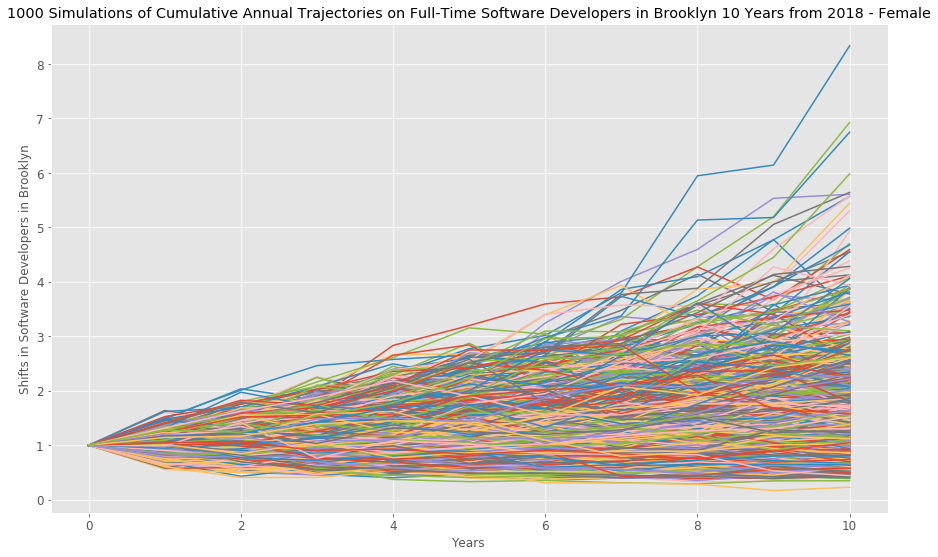

In [78]:
# Trajectory for the next 10 years
monte_carlo_cum_moves_software_brooklyn_decade = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Brooklyn 10 Years from 2018 - Female"
software_cumulative_moves_brooklyn.iloc[0:11, :].plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts in Software Developers in Brooklyn')
plt.show()

In [79]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
ending_software_cumulative_moves_brooklyn = software_cumulative_moves_brooklyn.iloc[-1, :]
ending_software_cumulative_moves_brooklyn.head()

0    14.697260
1     7.923141
2     4.562457
3     7.061688
4     0.201860
Name: 30, dtype: float64

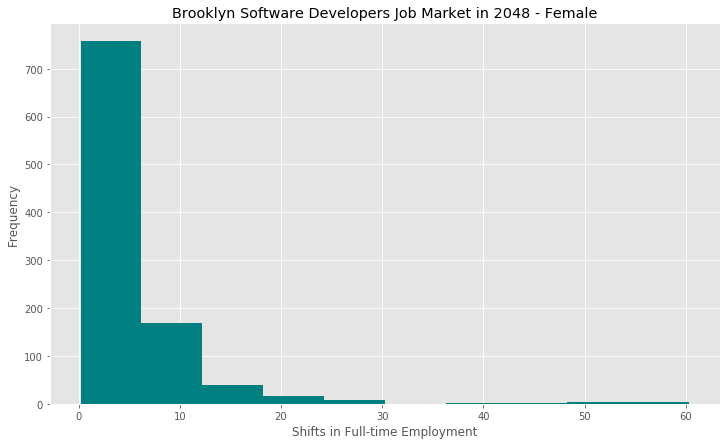

In [80]:
# Use the `plot` function to plot a frequency distribution of simulated ending prices
fig_hist_software_brooklyn = plt.figure()
ending_software_cumulative_moves_brooklyn.plot(kind='hist', bins=10, color = 'Teal', 
                             title='Brooklyn Software Developers Job Market in 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.show()

In [81]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
confidence_interval_software_brooklyn = ending_software_cumulative_moves_brooklyn.quantile(q=[0.025, 0.975])
confidence_interval_software_brooklyn

0.025     0.488331
0.975    20.900840
Name: 30, dtype: float64

In [82]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative employment ranges
ending_software_cumulative_moves_brooklyn.value_counts(bins=10) / len(ending_software_cumulative_moves_brooklyn)

(0.13, 6.205]       0.757
(6.205, 12.218]     0.169
(12.218, 18.231]    0.040
(18.231, 24.245]    0.016
(24.245, 30.258]    0.008
(54.312, 60.325]    0.003
(48.298, 54.312]    0.003
(42.285, 48.298]    0.002
(36.272, 42.285]    0.002
(30.258, 36.272]    0.000
Name: 30, dtype: float64

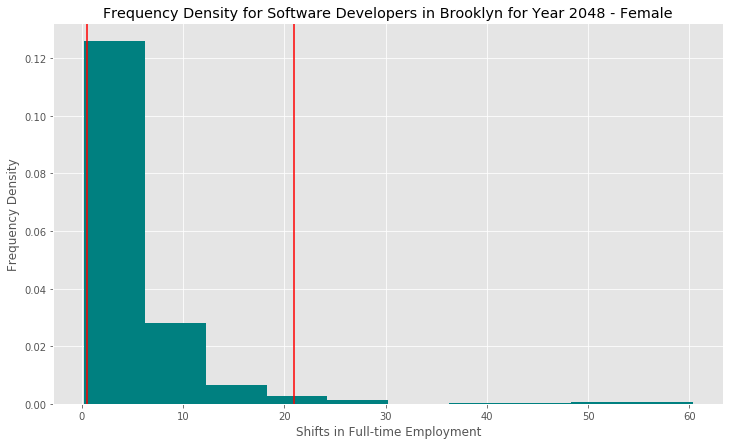

In [83]:
# Use the `plot` function to create a probability distribution histogram of simulated ending prices
# with markings for a 95% confidence interval
hist_cum_moves_software_brooklyn = plt.figure()
ending_software_cumulative_moves_brooklyn.plot(kind='hist', density=True, bins=10, color = 'teal', 
                             title='Frequency Density for Software Developers in Brooklyn for Year 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(confidence_interval_software_brooklyn.iloc[0], color='red')
plt.axvline(confidence_interval_software_brooklyn.iloc[1], color='red')
plt.show()

In [84]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
tenth_software_cumulative_moves_brooklyn = software_cumulative_moves_brooklyn.iloc[-20, :]
tenth_software_cumulative_moves_brooklyn.head()

0    3.333072
1    2.439866
2    2.000528
3    0.918209
4    0.808466
Name: 11, dtype: float64

In [85]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
tenth_software_confidence_interval_brooklyn = tenth_software_cumulative_moves_brooklyn.quantile(q=[0.025, 0.975])
tenth_software_confidence_interval_brooklyn

0.025    0.506146
0.975    4.601162
Name: 11, dtype: float64

In [86]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative employment ranges
tenth_software_cumulative_moves_brooklyn.value_counts(bins=10) / len(tenth_software_cumulative_moves_brooklyn)

(1.248, 2.205]                  0.394
(0.28099999999999997, 1.248]    0.343
(2.205, 3.161]                  0.175
(3.161, 4.118]                  0.051
(4.118, 5.074]                  0.019
(5.074, 6.03]                   0.007
(6.03, 6.987]                   0.006
(6.987, 7.943]                  0.003
(8.9, 9.856]                    0.002
(7.943, 8.9]                    0.000
Name: 11, dtype: float64

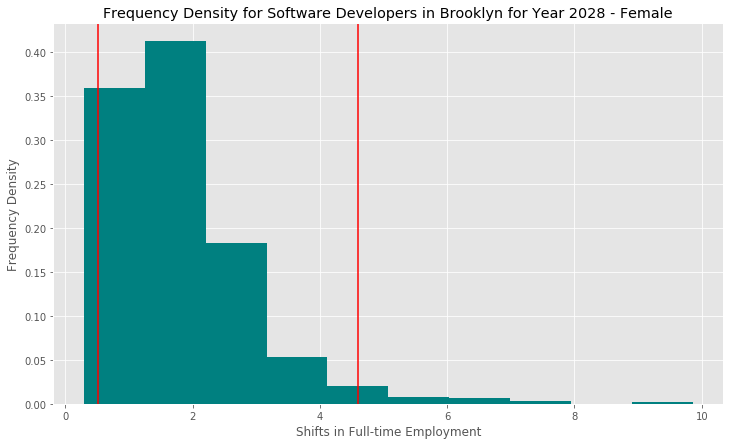

In [87]:
# Use the `plot` function to create a probability distribution histogram of simulated ending prices
# with markings for a 95% confidence interval
hist_tenth_software_cum_moves_brooklyn = plt.figure()
tenth_software_cumulative_moves_brooklyn.plot(kind='hist', density=True, bins=10, color = 'teal', 
                             title='Frequency Density for Software Developers in Brooklyn for Year 2028 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(tenth_software_confidence_interval_brooklyn.iloc[0], color='red')
plt.axvline(tenth_software_confidence_interval_brooklyn.iloc[1], color='red')
plt.show()

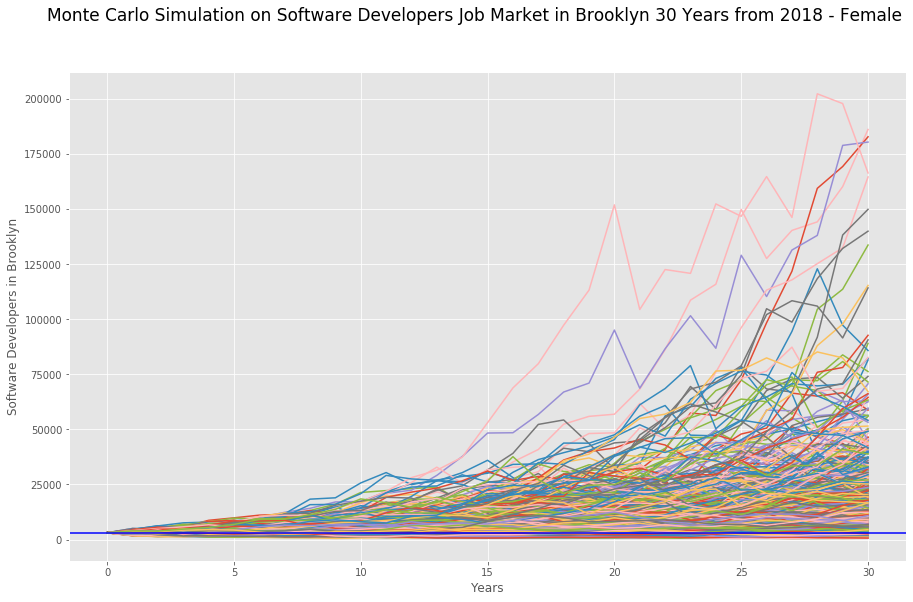

In [88]:
# Set initial employment
initial_software_brooklyn = software_devops_female_last_brooklyn 

# Plot scaled monte-carlo simulation for Brooklyn job market
fig_software_brooklyn = plt.figure(figsize=(15,9))
fig_software_brooklyn.suptitle('Monte Carlo Simulation on Software Developers Job Market in Brooklyn 30 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_brooklyn * initial_software_brooklyn)
#plt.axhline(y = software_devops_male_last_brooklyn, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_brooklyn, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Brooklyn')
plt.show()

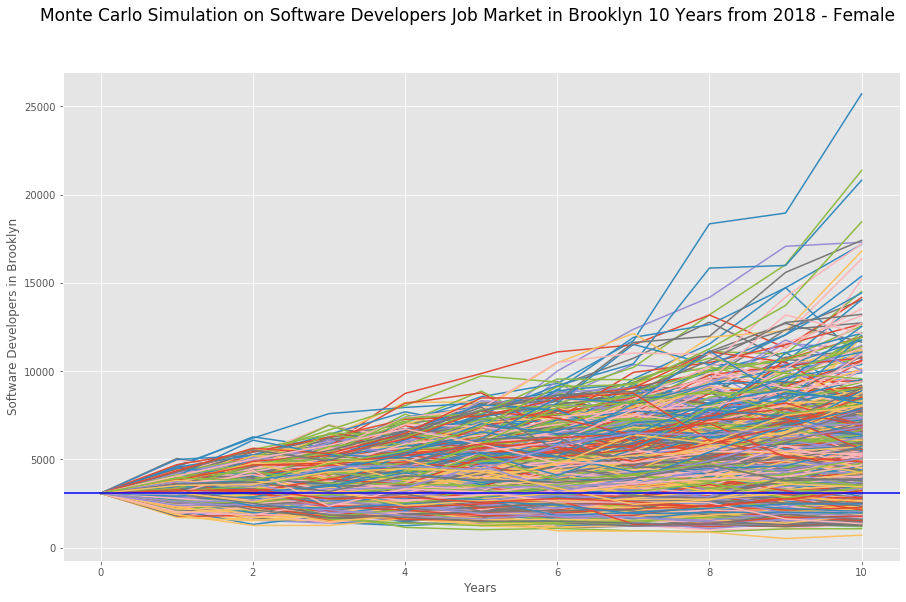

In [89]:
# Zoon in 10-year trajectories
fig_software_brooklyn = plt.figure(figsize=(15,9))
fig_software_brooklyn.suptitle('Monte Carlo Simulation on Software Developers Job Market in Brooklyn 10 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_brooklyn.iloc[0:11, :] * initial_software_brooklyn)
#plt.axhline(y = software_devops_male_last_brooklyn, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_brooklyn, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Brooklyn')
plt.show()

In [90]:
# Calculate investment profit/loss of lower and upper bound cumulative portfolio returns
software_gnl_lower_bound_brooklyn = initial_software_brooklyn * confidence_interval_software_brooklyn.iloc[0]
software_gnl_upper_bound_brooklyn = initial_software_brooklyn * confidence_interval_software_brooklyn.iloc[1]
                                                    
# Print the results
print(f"There is a 95% chance that an initial employment of {initial_software_brooklyn:,.0f}k for female software developers"
      f" in Brooklyn over the next 30 years will end within in the range of"
      f" {software_gnl_lower_bound_brooklyn:,.0f}k and {software_gnl_upper_bound_brooklyn:,.0f}k.")

There is a 95% chance that an initial employment of 3,085k for female software developers in Brooklyn over the next 30 years will end within in the range of 1,507k and 64,479k.


In [91]:
tenth_software_gnl_lower_bound_brooklyn = initial_software_brooklyn * tenth_software_confidence_interval_brooklyn.iloc[0]
tenth_software_gnl_upper_bound_brooklyn = initial_software_brooklyn * tenth_software_confidence_interval_brooklyn.iloc[1]
                                                    
# Print the results
print(f"There is a 95% chance that an initial employment of {initial_software_brooklyn:,.0f}k on female software developers"
      f" in Brooklyn will end within in the range of"
      f" {tenth_software_gnl_lower_bound_brooklyn:,.0f}k and {tenth_software_gnl_upper_bound_brooklyn:,.0f}k over the next 10 years .")

There is a 95% chance that an initial employment of 3,085k on female software developers in Brooklyn will end within in the range of 1,561k and 14,195k over the next 10 years .


In [92]:
software_trajectories_brooklyn = initial_software_brooklyn * software_cumulative_moves_brooklyn.quantile(q=[0.05, 0.5, 0.95], axis='columns', numeric_only=True).T
software_trajectories_brooklyn.columns = ['Lower 5%', 'Median', 'Upper 5%']
software_trajectories_brooklyn

,Lower 5%,Median,Upper 5%
0,3085.000000,3085.000000,3085.000000
1,2392.335325,3249.816680,4137.413220
2,2265.913256,3349.720812,4877.311334
3,2121.779381,3584.729427,5400.370349
4,1944.787059,3620.353167,6240.632756
5,2009.451891,3833.962241,6856.440382
6,1975.583355,3950.725209,7519.815722
7,1914.545821,4091.529029,8368.285096
8,1861.111428,4188.032104,9227.320718
9,1836.236404,4395.431119,9731.998316


<Figure size 432x288 with 0 Axes>

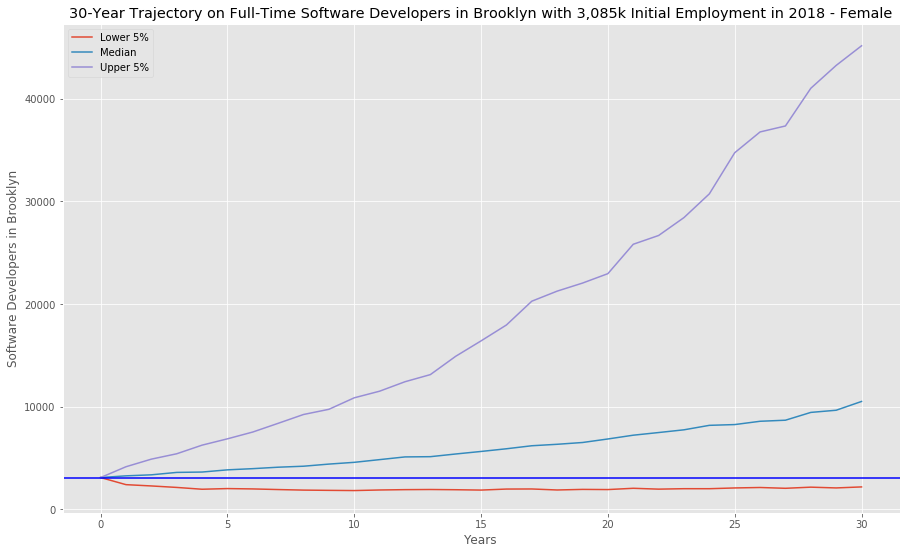

In [94]:
ax_cum_software_brooklyn = plt.figure()
software_trajectories_brooklyn.plot(title="30-Year Trajectory on Full-Time Software Developers in Brooklyn with 3,085k Initial Employment in 2018 - Female",
                          figsize=(15, 9))
#plt.axhline(y = software_devops_male_last_brooklyn, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_brooklyn, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Brooklyn')
plt.show()

### Monte Carlo Simulation on Full-Time Computer Developers in Queens Over 30 Years Starting from 2018

In [95]:
software_df_queens = software_devops_Queens
software_df_queens

Software_devops_male  \
County Year Name                                            
081    2010 Queens County, New York                4185.0   
       2011 Queens County, New York                6753.0   
       2012 Queens County, New York                6748.0   
       2013 Queens County, New York                6815.0   
       2014 Queens County, New York                6937.0   
       2015 Queens County, New York                6142.0   
       2016 Queens County, New York                7991.0   
       2017 Queens County, New York                9778.0   
       2018 Queens County, New York                6919.0   

                                     Software_devops_female  
County Year Name                                             
081    2010 Queens County, New York                  1310.0  
       2011 Queens County, New York                  2046.0  
       2012 Queens County, New York                  1310.0  
       2013 Queens County, New York                  2436.0  
       2014 Queens County, New York                  1709.0  
       2015 Queens County, New York                  2016.0  
       2016 Queens County, New York                  2150.0  
       2017 Queens County, New York                  1731.0  
       2018 Queens County, New York                  1021.0

In [96]:
# Use the `pct_change` function to calculate daily returns of `male` and `female`.
annual_moves_software_queens = software_df_queens.pct_change().fillna(0)
annual_moves_software_queens

Software_devops_male  \
County Year Name                                            
081    2010 Queens County, New York              0.000000   
       2011 Queens County, New York              0.613620   
       2012 Queens County, New York             -0.000740   
       2013 Queens County, New York              0.009929   
       2014 Queens County, New York              0.017902   
       2015 Queens County, New York             -0.114603   
       2016 Queens County, New York              0.301042   
       2017 Queens County, New York              0.223627   
       2018 Queens County, New York             -0.292391   

                                     Software_devops_female  
County Year Name                                             
081    2010 Queens County, New York                0.000000  
       2011 Queens County, New York                0.561832  
       2012 Queens County, New York               -0.359726  
       2013 Queens County, New York                0.859542  
       2014 Queens County, New York               -0.298440  
       2015 Queens County, New York                0.179637  
       2016 Queens County, New York                0.066468  
       2017 Queens County, New York               -0.194884  
       2018 Queens County, New York               -0.410168

In [97]:
# Use the `mean` function to calculate the mean of market shifts for `male` and `female`, respectively
avg_annual_moves_software_devops_male_queens = annual_moves_software_queens.mean()['Software_devops_male']
avg_annual_moves_software_devops_female_queens = annual_moves_software_queens.mean()['Software_devops_female']
avg_annual_moves_software_devops_male_queens

0.08426498497395268

In [98]:
avg_annual_moves_software_devops_female_queens

0.04491798883062321

In [99]:
# Use the `std` function to calculate the standard deviation of market moves for `male` and `female`, respectively
std_dev_annual_moves_software_devops_male_queens = annual_moves_software_queens.std()['Software_devops_male']
std_dev_annual_moves_software_devops_female_queens = annual_moves_software_queens.std()['Software_devops_female']
std_dev_annual_moves_software_devops_male_queens

0.2627511654971969

In [100]:
std_dev_annual_moves_software_devops_female_queens

0.4326781663147727

In [101]:
# Set number of simulations and trading days
num_simulations = 1000
num_years = 30

# Set last employment figures of `Software_devops_male` and `Software_devops_female`
software_devops_male_last_queens  = software_df_queens['Software_devops_male'][-1]
software_devops_female_last_queens = software_df_queens['Software_devops_female'][-1]

# Initialize empty DataFrame to hold simulated employment data for each simulation
simulated_software_df_queens = pd.DataFrame()
software_cumulative_moves_queens = pd.DataFrame()

# Run the simulation of projecting employment for the next 30 years, `1000` times
for n in range(num_simulations):
    
    count = 0
    
    simulated_software_devop_male_queens = []
    simulated_software_devop_female_queens = []

    # Initialize the simulated prices list with the last employmentdata of `Software_devops_male` and `Software_devops_female`
    simulated_software_devops_male_queens = [software_devops_male_last_queens]
    simulated_software_devops_female_queens = [software_devops_female_last_queens]
    
    # Simulate the returns for 30 years
    for i in range(num_years):
        
        if count == 30:
            break
            
        simulated_software_devop_male_queens = simulated_software_devops_male_queens[count] * (1 + np.random.normal(avg_annual_moves_software_devops_male_queens, std_dev_annual_moves_software_devops_male_queens))
        simulated_software_devop_female_queens = simulated_software_devops_female_queens[count] * (1 + np.random.normal(avg_annual_moves_software_devops_female_queens, std_dev_annual_moves_software_devops_female_queens))

        simulated_software_devops_male_queens.append(simulated_software_devop_male_queens)
        simulated_software_devops_female_queens.append(simulated_software_devop_female_queens)
        
        count += 1
            
    # Append a simulated prices of each simulation to DataFrame
    simulated_software_df_queens['Software_devops_male'] = simulated_software_devops_male_queens
    simulated_software_df_queens['Software_devops_female'] = simulated_software_devops_female_queens
    
    # Calculate the daily returns of simulated prices
    simulated_software_moves_queens = simulated_software_df_queens.pct_change()
    
    # Set the portfolio weights (0% male; 100% female)
    weights = [0.0, 1.0]

    # Use the `dot` function with the weights to multiply weights with each column's simulated daily returns
    software_annual_moves_queens = simulated_software_moves_queens.dot(weights)
    
    # Calculate the normalized, cumulative return series
    software_cumulative_moves_queens[n] = (1 + software_annual_moves_queens.fillna(0)).cumprod()

# Print records from the DataFrame
software_cumulative_moves_queens

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.878112,1.232661,1.413565,1.319560,1.016732,1.468528,1.092905,1.269361,0.773191,0.935687,...,1.265775,1.327546,0.230918,0.912213,1.141516,1.529365,1.126829,1.313840,0.670982,0.655736
2,1.089394,1.984299,2.095519,1.337824,1.773393,1.017584,1.541127,0.900466,0.441089,0.909983,...,0.700785,1.787782,0.234218,0.615302,0.666920,1.888995,1.131033,2.285499,0.702642,1.075551
3,1.314849,2.331517,3.635035,0.989219,3.238217,1.269755,1.455894,1.199797,0.253932,1.088601,...,0.679480,1.745680,0.170349,0.592042,0.821137,2.412108,1.603000,3.011606,0.627969,0.307822
4,1.230867,0.930688,2.711355,0.812794,0.853864,1.215103,1.399517,1.504642,0.326196,0.804682,...,0.542904,2.730070,0.233398,0.556144,0.462138,2.514721,1.835159,1.662555,0.801500,0.305552
5,0.555068,0.390033,4.151944,1.459178,1.246561,1.690030,0.789382,2.372430,0.262670,0.379217,...,0.461169,2.215911,0.196944,0.235449,0.583908,2.546327,1.777228,1.652300,1.313035,0.242581
6,0.100997,0.250574,5.003698,0.770630,1.858265,0.974610,0.762777,1.568129,0.273590,0.180913,...,0.444770,2.867837,0.243992,0.313490,0.459382,4.424669,1.048865,1.599462,2.344311,0.312133
7,0.085541,0.145432,1.777717,1.124687,1.426456,1.141908,-0.024163,0.863408,0.163310,0.257508,...,0.537979,3.290411,0.204157,0.288809,0.419953,4.193515,2.121826,1.691442,2.739843,0.380239
8,0.122859,0.116134,0.764825,1.778409,1.015813,0.815443,-0.020504,1.101101,0.157800,0.111169,...,0.231025,3.229959,0.234743,0.219212,0.130880,5.286362,1.535850,2.385307,2.371493,0.147160
9,0.147248,0.222431,0.529454,2.382422,1.417518,1.039409,-0.008133,0.540095,0.251800,0.114131,...,0.210292,4.023413,0.267040,0.261574,0.201651,6.742569,1.551996,3.760479,2.112597,0.152848


<Figure size 432x288 with 0 Axes>

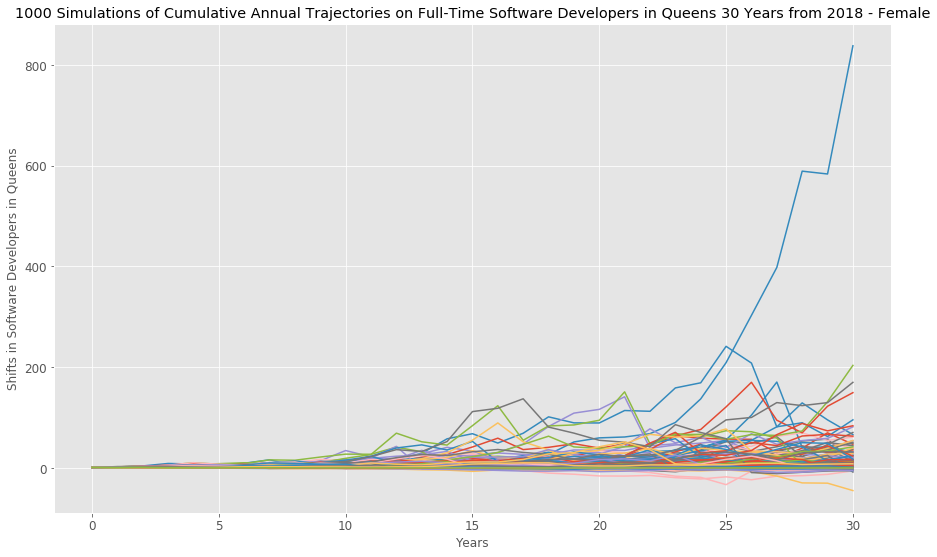

In [102]:
# Use the `plot` function to plot `1000` simulations of the potential trajectories of the employment on software developers based on a year
monte_carlo_cum_moves_software_queens = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Queens 30 Years from 2018 - Female"
software_cumulative_moves_queens.plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts in Software Developers in Queens')
plt.show()

<Figure size 432x288 with 0 Axes>

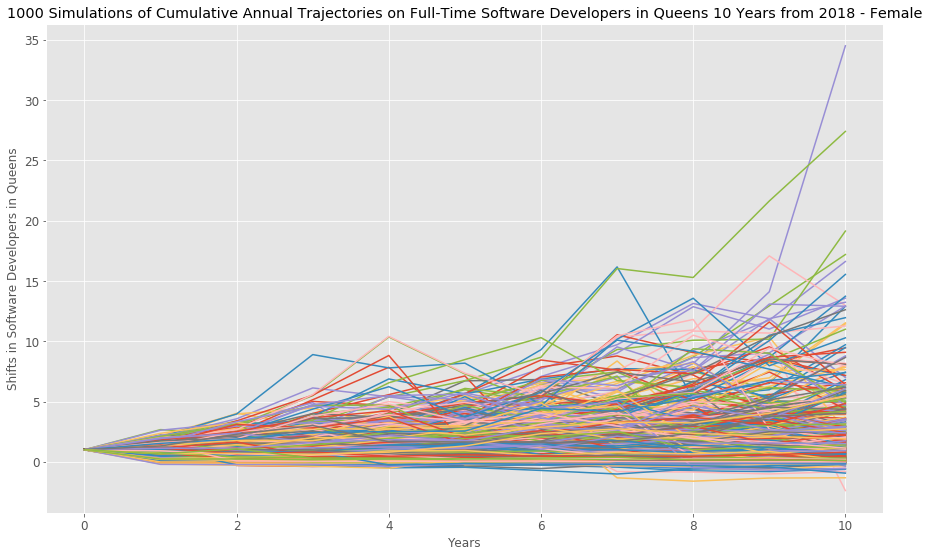

In [103]:
# Trajectories for the next 10 years
monte_carlo_cum_moves_software_queens = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Queens 10 Years from 2018 - Female"
software_cumulative_moves_queens.iloc[0:11, :].plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts in Software Developers in Queens')
plt.show()

In [104]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
ending_software_cumulative_moves_queens = software_cumulative_moves_queens.iloc[-1, :]
ending_software_cumulative_moves_queens.head()

0    0.003017
1    0.005381
2    1.220769
3   -0.011480
4   -0.001306
Name: 30, dtype: float64

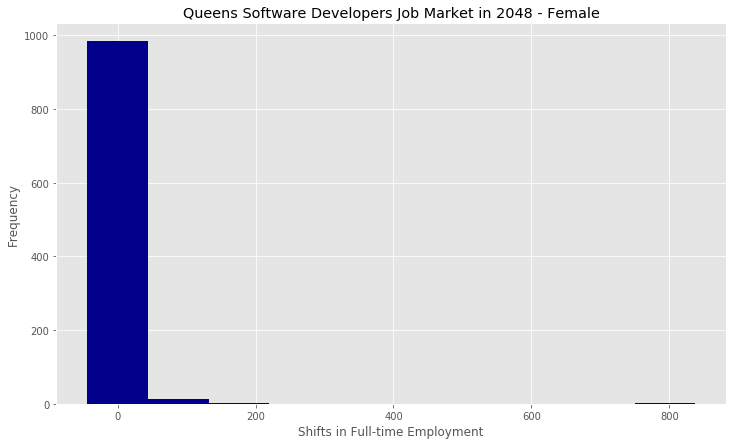

In [105]:
# Use the `plot` function to plot a frequency distribution of simulated ending employment
fig_hist_software_queens = plt.figure()
ending_software_cumulative_moves_queens.plot(kind='hist', bins=10, color = 'darkblue', 
                             title='Queens Software Developers Job Market in 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.show()

In [106]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
confidence_interval_software_queens = ending_software_cumulative_moves_queens.quantile(q=[0.025, 0.975])
confidence_interval_software_queens

0.025    -0.425793
0.975    31.147889
Name: 30, dtype: float64

In [107]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative moves ranges
ending_software_cumulative_moves_queens.value_counts(bins=10) / len(ending_software_cumulative_moves_queens)

(-45.791, 43.385]     0.983
(43.385, 131.678]     0.013
(131.678, 219.97]     0.003
(749.727, 838.019]    0.001
(661.434, 749.727]    0.000
(573.141, 661.434]    0.000
(484.849, 573.141]    0.000
(396.556, 484.849]    0.000
(308.263, 396.556]    0.000
(219.97, 308.263]     0.000
Name: 30, dtype: float64

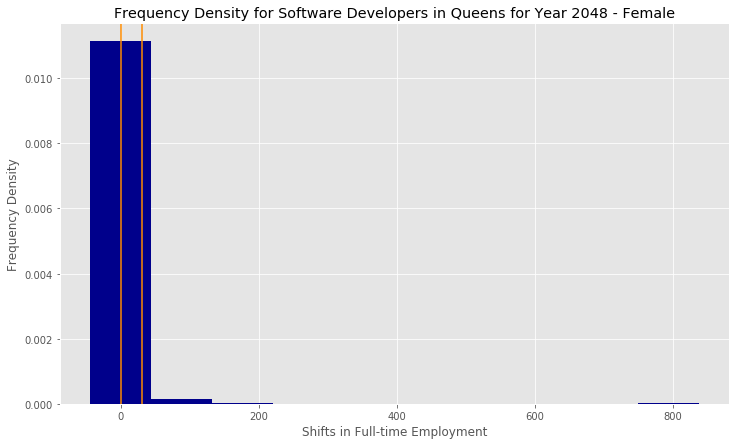

In [108]:
# Use the `plot` function to create a probability distribution histogram of simulated ending employment
# with markings for a 95% confidence interval
hist_cum_moves_software_queens = plt.figure()
ending_software_cumulative_moves_queens.plot(kind='hist', density=True, bins=10, color = 'darkblue', 
                             title='Frequency Density for Software Developers in Queens for Year 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(confidence_interval_software_queens.iloc[0], color='darkorange')
plt.axvline(confidence_interval_software_queens.iloc[1], color='darkorange')
plt.show()

In [109]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
tenth_software_cumulative_moves_queens = software_cumulative_moves_queens.iloc[-20, :]
tenth_software_cumulative_moves_queens.head()

0    0.050450
1    0.139327
2    0.575874
3    3.565947
4    0.999381
Name: 11, dtype: float64

In [110]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
tenth_software_confidence_interval_queens = tenth_software_cumulative_moves_queens.quantile(q=[0.025, 0.975])
tenth_software_confidence_interval_queens

0.025   -0.076608
0.975    9.900783
Name: 11, dtype: float64

In [111]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative moves ranges
tenth_software_cumulative_moves_queens.value_counts(bins=10) / len(tenth_software_cumulative_moves_queens)

(-1.9969999999999999, 0.943]    0.624
(0.943, 3.852]                  0.272
(3.852, 6.762]                  0.054
(6.762, 9.671]                  0.022
(9.671, 12.581]                 0.014
(21.31, 24.219]                 0.004
(12.581, 15.491]                0.004
(24.219, 27.129]                0.002
(18.4, 21.31]                   0.002
(15.491, 18.4]                  0.002
Name: 11, dtype: float64

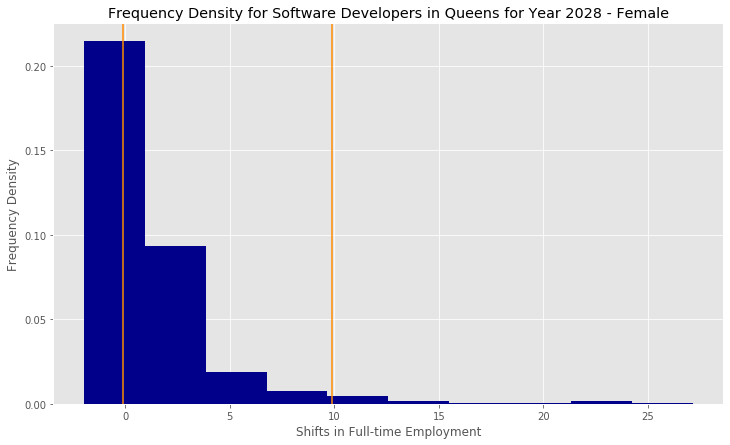

In [112]:
# Use the `plot` function to create a probability distribution histogram of simulated ending employment
# with markings for a 95% confidence interval
hist_tenth_software_cum_moves_queens = plt.figure()
tenth_software_cumulative_moves_queens.plot(kind='hist', density=True, bins=10, color = 'darkblue', 
                             title='Frequency Density for Software Developers in Queens for Year 2028 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(tenth_software_confidence_interval_queens.iloc[0], color='darkorange')
plt.axvline(tenth_software_confidence_interval_queens.iloc[1], color='darkorange')
plt.show()

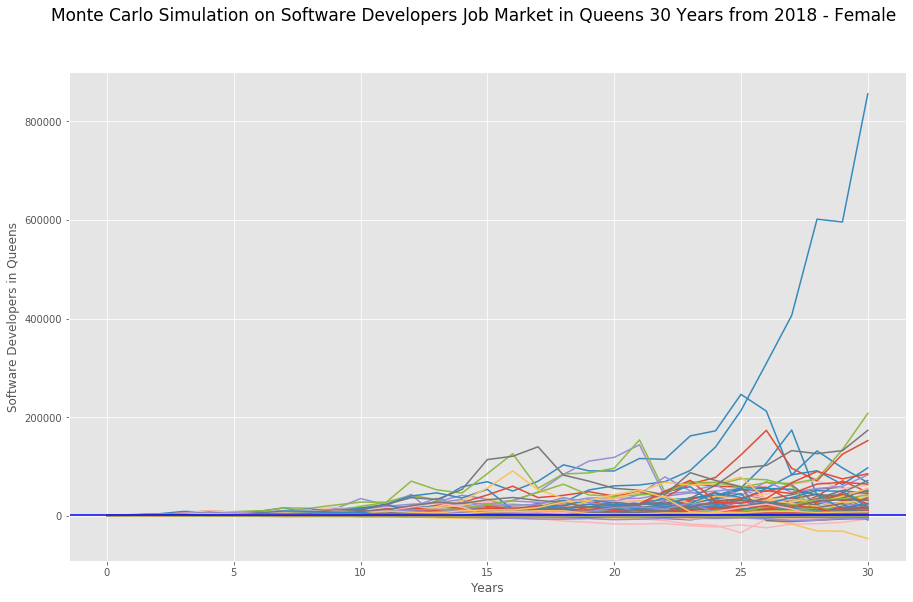

In [113]:
# Set initial employment
initial_software_queens = software_devops_female_last_queens

fig_software_queens = plt.figure(figsize=(15,9))
fig_software_queens.suptitle('Monte Carlo Simulation on Software Developers Job Market in Queens 30 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_queens * initial_software_queens)
#plt.axhline(y = software_devops_male_last_queens, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_queens, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Queens')
plt.show()

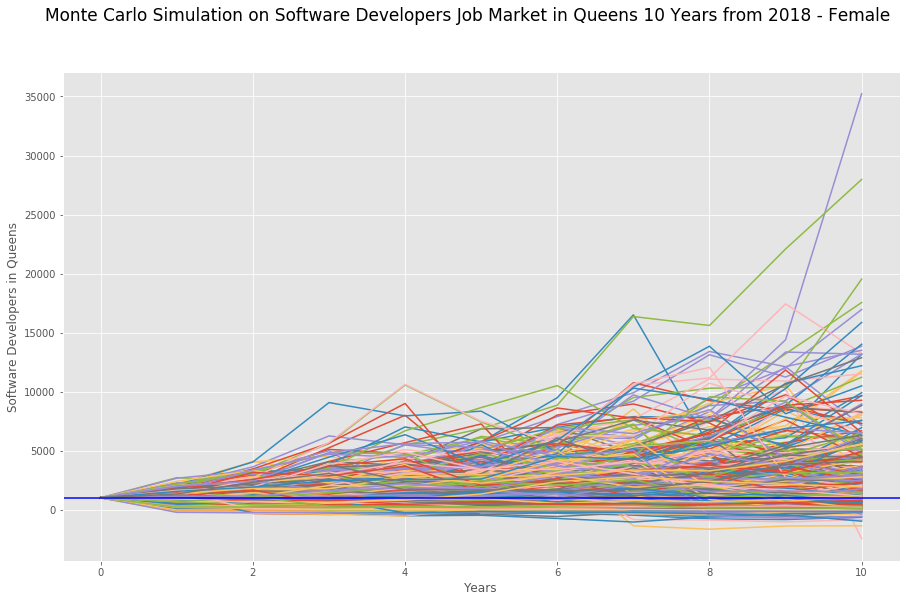

In [114]:
# Zoom in 10-year trajectories
# initial_software_queens = 0.5*(software_devops_male_last_queens + software_devops_female_last_queens)

fig_software_queens = plt.figure(figsize=(15,9))
fig_software_queens.suptitle('Monte Carlo Simulation on Software Developers Job Market in Queens 10 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_queens.iloc[0:11, :] * initial_software_queens)
#plt.axhline(y = software_devops_male_last_queens, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_queens, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Queens')
plt.show()

In [115]:
# Calculate gain/loss of lower and upper bound cumulative job market in Queens
software_gnl_lower_bound_queens = initial_software_queens * confidence_interval_software_queens.iloc[0]
software_gnl_upper_bound_queens = initial_software_queens * confidence_interval_software_queens.iloc[1]
                                                    
# Print the results
print(f"There is a 95% chance that an initial employment of {initial_software_queens:,.0f}k for female software developers"
      f" in Queens over the next 30 years will end within in the range of"
      f" {software_gnl_lower_bound_queens:,.0f}k and {software_gnl_upper_bound_queens:,.0f}k.")

There is a 95% chance that an initial employment of 1,021k for female software developers in Queens over the next 30 years will end within in the range of -435k and 31,802k.


In [116]:
# Calculate gain/loss of lower and upper bound cumulative job market in Queens
tenth_software_gnl_lower_bound_queens = initial_software_queens * tenth_software_confidence_interval_queens.iloc[0]
tenth_software_gnl_upper_bound_queens = initial_software_queens * tenth_software_confidence_interval_queens.iloc[1]
                                                    
# Print the results
print(f"There is a 95% chance that an initial employment of {initial_software_queens:,.0f}k for female software developers"
      f" in Queens over the next 10 years will end within in the range of"
      f" {tenth_software_gnl_lower_bound_queens:,.0f}k and {tenth_software_gnl_upper_bound_queens:,.0f}k.")

There is a 95% chance that an initial employment of 1,021k for female software developers in Queens over the next 10 years will end within in the range of -78k and 10,109k.


In [117]:
software_trajectories_queens = initial_software_queens * software_cumulative_moves_queens.quantile(q=[0.05, 0.5, 0.95], axis='columns', numeric_only=True).T
software_trajectories_queens.columns = ['Lower 5%', 'Median', 'Upper 5%']
software_trajectories_queens

,Lower 5%,Median,Upper 5%
0,1021.000000,1021.000000,1021.000000
1,352.261352,1102.687075,1827.699624
2,216.369288,1039.196730,2458.089347
3,131.556478,1044.833318,3023.805021
4,81.159003,945.384459,3546.111436
5,40.432199,896.088813,3879.113454
6,16.420767,804.788046,4535.730109
7,1.996648,757.411753,4996.823305
8,-2.353484,675.286875,5550.470664
9,-2.169820,649.693737,5558.937421


<Figure size 432x288 with 0 Axes>

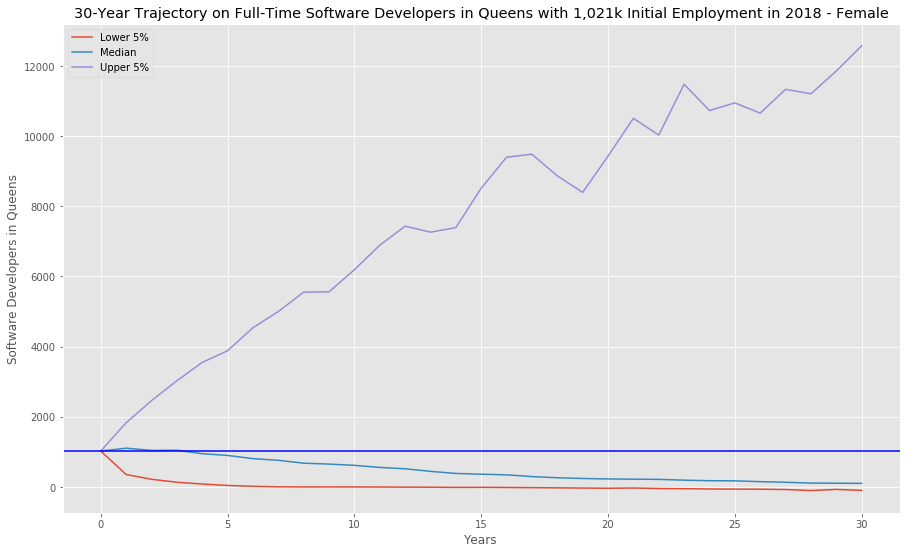

In [119]:
ax_cum_software_queens = plt.figure()
software_trajectories_queens.plot(title="30-Year Trajectory on Full-Time Software Developers in Queens with 1,021k Initial Employment in 2018 - Female",
                          figsize=(15, 9))
#plt.axhline(y = software_devops_male_last_queens, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_queens, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Queens')
plt.show()

<Figure size 432x288 with 0 Axes>

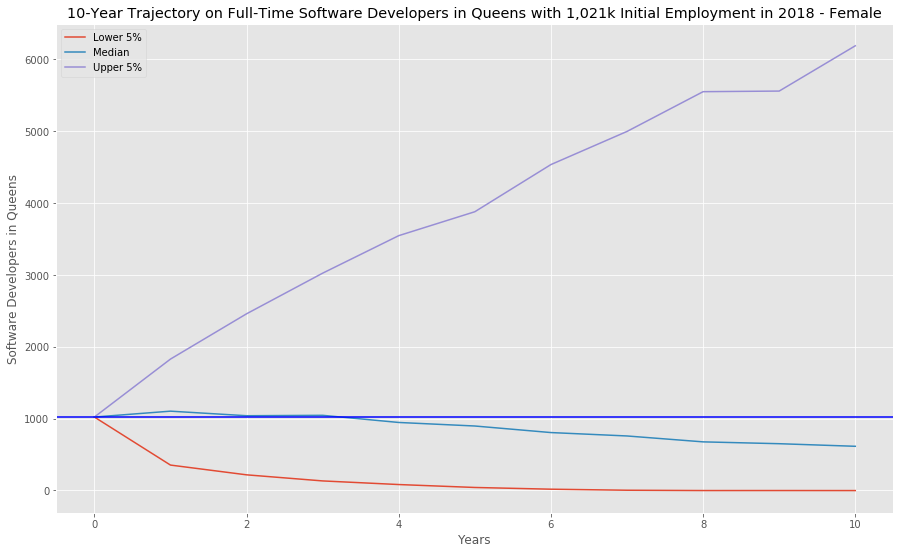

In [120]:
ax_cum_software_queens_decade = plt.figure()
software_trajectories_queens.iloc[0:11, :].plot(title="10-Year Trajectory on Full-Time Software Developers in Queens with 1,021k Initial Employment in 2018 - Female",
                          figsize=(15, 9))
#plt.axhline(y = software_devops_male_last_queens, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_queens, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Queens')
plt.show()

### Monte Carlo Simulation on Full-Time Software Developers in Staten Island Over 30 Years Starting from 2018

In [121]:
software_df_staten = software_devops_Staten_Island
software_df_staten

Software_devops_male  \
County Year Name                                              
085    2010 Richmond County, New York                 995.0   
       2011 Richmond County, New York                1078.0   
       2012 Richmond County, New York                1115.0   
       2013 Richmond County, New York                 999.0   
       2014 Richmond County, New York                 725.0   
       2015 Richmond County, New York                1234.0   
       2016 Richmond County, New York                1309.0   
       2017 Richmond County, New York                2311.0   
       2018 Richmond County, New York                2118.0   

                                       Software_devops_female  
County Year Name                                               
085    2010 Richmond County, New York                   765.0  
       2011 Richmond County, New York                   596.0  
       2012 Richmond County, New York                   746.0  
       2013 Richmond County, New York                   660.0  
       2014 Richmond County, New York                   633.0  
       2015 Richmond County, New York                   330.0  
       2016 Richmond County, New York                   355.0  
       2017 Richmond County, New York                   442.0  
       2018 Richmond County, New York                   269.0

In [122]:
# Use the `pct_change` function to calculate daily returns of `male` and `female`.
annual_moves_software_staten = software_df_staten.pct_change().fillna(0)
annual_moves_software_staten

Software_devops_male  \
County Year Name                                              
085    2010 Richmond County, New York              0.000000   
       2011 Richmond County, New York              0.083417   
       2012 Richmond County, New York              0.034323   
       2013 Richmond County, New York             -0.104036   
       2014 Richmond County, New York             -0.274274   
       2015 Richmond County, New York              0.702069   
       2016 Richmond County, New York              0.060778   
       2017 Richmond County, New York              0.765470   
       2018 Richmond County, New York             -0.083514   

                                       Software_devops_female  
County Year Name                                               
085    2010 Richmond County, New York                0.000000  
       2011 Richmond County, New York               -0.220915  
       2012 Richmond County, New York                0.251678  
       2013 Richmond County, New York               -0.115282  
       2014 Richmond County, New York               -0.040909  
       2015 Richmond County, New York               -0.478673  
       2016 Richmond County, New York                0.075758  
       2017 Richmond County, New York                0.245070  
       2018 Richmond County, New York               -0.391403

In [123]:
# Use the `mean` function to calculate the mean of market shifts for `male` and `female`, respectively
avg_annual_moves_software_devops_male_staten = annual_moves_software_staten.mean()['Software_devops_male']
avg_annual_moves_software_devops_female_staten = annual_moves_software_staten.mean()['Software_devops_female']
avg_annual_moves_software_devops_male_staten

0.131581430439857

In [124]:
avg_annual_moves_software_devops_female_staten

-0.07496394166684989

In [125]:
# Use the `std` function to calculate the standard deviation of market moves for `male` and `female`, respectively
std_dev_annual_moves_software_devops_male_staten = annual_moves_software_staten.std()['Software_devops_male']
std_dev_annual_moves_software_devops_female_staten = annual_moves_software_staten.std()['Software_devops_female']
std_dev_annual_moves_software_devops_male_staten

0.35844745468602085

In [126]:
std_dev_annual_moves_software_devops_female_staten

0.2560895529900319

In [127]:
# Set number of simulations and trading days
num_simulations = 1000
num_years = 30

# Set last employment figures of `Software_devops_male` and `Software_devops_female`
software_devops_male_last_staten = software_df_staten['Software_devops_male'][-1]
software_devops_female_last_staten = software_df_staten['Software_devops_female'][-1]

# Initialize empty DataFrame to hold simulated employment data for each simulation
simulated_software_df_staten = pd.DataFrame()
software_cumulative_moves_staten = pd.DataFrame()

# Run the simulation of projecting employment for the next 30 years, `1000` times
for n in range(num_simulations):
    
    count = 0
    
    simulated_software_devop_male_staten = []
    simulated_software_devop_female_staten = []

    # Initialize the simulated prices list with the last employmentdata of `Software_devops_male` and `Software_devops_female`
    simulated_software_devops_male_staten = [software_devops_male_last_staten]
    simulated_software_devops_female_staten = [software_devops_female_last_staten]
       
    # Simulate the returns for 30 years
    for i in range(num_years):
        
        if count == 30:
            break
            
        simulated_software_devop_male_staten = simulated_software_devops_male_staten[count] * (1 + np.random.normal(avg_annual_moves_software_devops_male_staten, std_dev_annual_moves_software_devops_male_staten))
        simulated_software_devop_female_staten = simulated_software_devops_female_staten[count] * (1 + np.random.normal(avg_annual_moves_software_devops_female_staten, std_dev_annual_moves_software_devops_female_staten))

        simulated_software_devops_male_staten.append(simulated_software_devop_male_staten)
        simulated_software_devops_female_staten.append(simulated_software_devop_female_staten)
        
        count += 1
            
    # Append a simulated prices of each simulation to DataFrame
    simulated_software_df_staten['Software_devops_male'] = simulated_software_devops_male_staten
    simulated_software_df_staten['Software_devops_female'] = simulated_software_devops_female_staten
    
    # Calculate the daily returns of simulated prices
    simulated_software_moves_staten = simulated_software_df_staten.pct_change()
    
    # Set the portfolio weights (0% male; 100% female)
    weights = [0.0, 1.0]

    # Use the `dot` function with the weights to multiply weights with each column's simulated daily returns
    software_annual_moves_staten = simulated_software_moves_staten.dot(weights)
    
    # Calculate the normalized, cumulative return series
    software_cumulative_moves_staten[n] = (1 + software_annual_moves_staten.fillna(0)).cumprod()

# Print records from the DataFrame
software_cumulative_moves_staten

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.150225,0.942343,1.185462,0.864297,0.855646,1.097832,0.977556,0.697506,0.613675,1.357153,...,1.171662,1.028794,0.902293,1.140819,0.808228,1.245005,1.005403,1.132449,0.943569,1.079543
2,0.552197,0.676450,0.874659,1.053928,0.921352,1.538186,0.618631,0.486360,0.648387,1.346701,...,1.527201,0.793635,0.861723,0.811770,0.971206,0.807053,1.113480,0.776597,0.952529,1.011174
3,0.534707,1.008627,0.949581,1.089518,0.902605,1.602217,0.880857,0.599422,0.368556,0.820913,...,0.989904,0.935065,0.773940,0.639226,1.219099,0.945282,0.807691,0.687370,1.145780,1.525281
4,0.395561,1.148353,0.699785,0.800731,1.167625,1.686084,0.811700,0.670106,0.260555,0.523844,...,1.376216,1.103438,0.423313,0.668394,1.613010,1.156735,0.647984,0.813573,1.209053,1.341271
5,0.482731,0.709448,0.776075,0.875193,1.016893,0.981683,1.424453,0.654350,0.246604,0.623458,...,1.703441,1.008365,0.486725,0.472617,1.693477,0.917879,0.717589,0.634921,1.186164,0.882476
6,0.375525,0.801997,0.713384,0.870755,1.239460,1.101934,0.975480,0.557336,0.295971,0.581073,...,2.604782,0.710485,0.440168,0.332771,1.625837,1.011847,0.903938,0.521691,1.347085,0.830393
7,0.334143,0.745351,0.783798,0.522472,0.985681,0.983254,0.614124,0.674015,0.254894,0.569701,...,2.658867,0.594229,0.332774,0.257875,1.866253,1.096823,1.107133,0.456063,1.608880,0.950054
8,0.418108,0.392828,0.605591,0.419634,0.917673,1.583290,0.364314,0.770628,0.344494,0.352722,...,2.347050,0.438980,0.298513,0.123095,1.115273,0.975328,1.176885,0.613412,1.821488,1.018948
9,0.476571,0.352923,0.298827,0.403850,0.761288,1.264785,0.422995,0.773803,0.516563,0.355396,...,2.722462,0.289758,0.284655,0.119437,0.841672,0.834376,0.946345,0.163977,1.956044,0.961393


<Figure size 432x288 with 0 Axes>

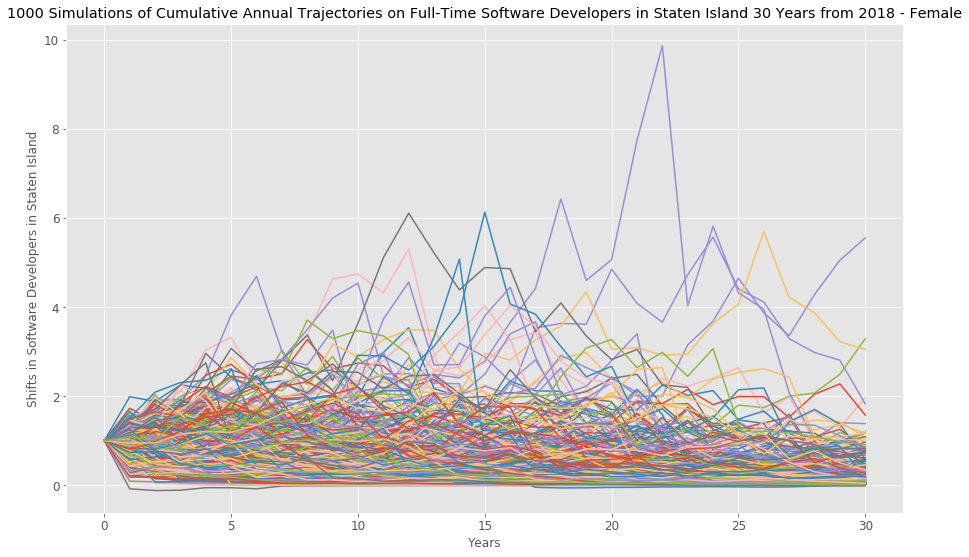

In [128]:
# Use the `plot` function to plot `1000` simulations of the potential trajectories of the employment on software developers based on a year
monte_carlo_cum_moves_software_staten = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Staten Island 30 Years from 2018 - Female"
software_cumulative_moves_staten.plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts in Software Developers in Staten Island')
plt.show()

<Figure size 432x288 with 0 Axes>

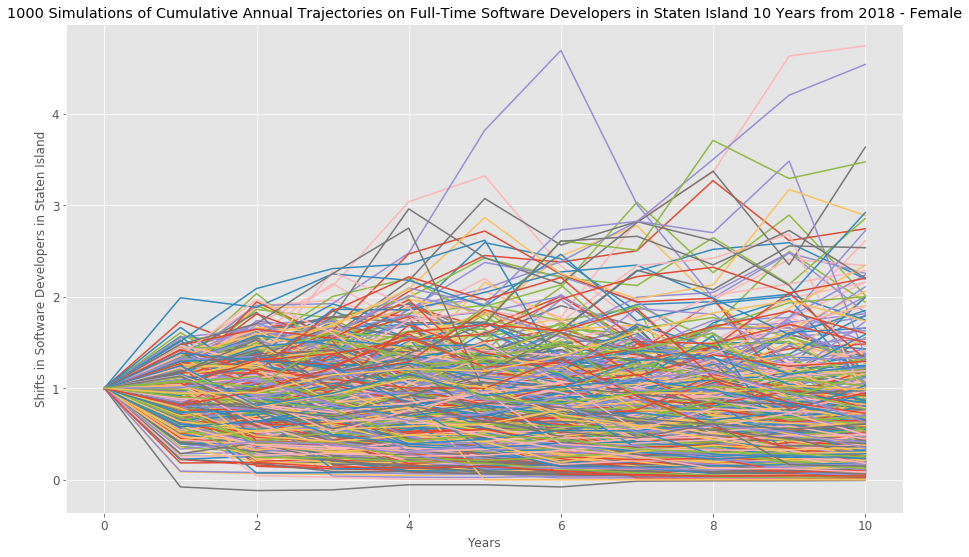

In [129]:
# Trajectories for the next 10 years
monte_carlo_cum_moves_software_staten_decade = plt.figure()
plot_title = f"{n+1} Simulations of Cumulative Annual Trajectories on Full-Time Software Developers in Staten Island 10 Years from 2018 - Female"
software_cumulative_moves_staten.iloc[0:11, :].plot(legend=None, title=plot_title, figsize=(15, 9), fontsize=12)
plt.xlabel('Years')
plt.ylabel('Shifts in Software Developers in Staten Island')
plt.show()

In [130]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
ending_software_cumulative_moves_staten = software_cumulative_moves_staten.iloc[-1, :]
ending_software_cumulative_moves_staten.head()

0    0.061589
1    0.029122
2    0.033040
3    0.053772
4    0.602389
Name: 30, dtype: float64

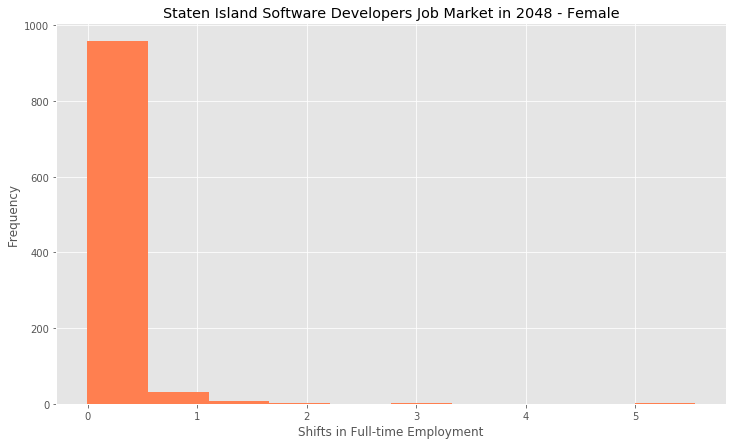

In [131]:
# Use the `plot` function to plot a frequency distribution of simulated ending prices
fig_hist_software_staten = plt.figure()
ending_software_cumulative_moves_staten.plot(kind='hist', bins=10, color = 'coral', 
                             title='Staten Island Software Developers Job Market in 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.show()

In [132]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
confidence_interval_software_staten = ending_software_cumulative_moves_staten.quantile(q=[0.025, 0.975])
confidence_interval_software_staten

0.025    0.000483
0.975    0.813058
Name: 30, dtype: float64

In [133]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative moves ranges
ending_software_cumulative_moves_staten.value_counts(bins=10) / len(ending_software_cumulative_moves_staten)

(-0.0173, 0.545]    0.957
(0.545, 1.102]      0.030
(1.102, 1.658]      0.008
(2.77, 3.326]       0.002
(1.658, 2.214]      0.002
(4.994, 5.551]      0.001
(4.438, 4.994]      0.000
(3.882, 4.438]      0.000
(3.326, 3.882]      0.000
(2.214, 2.77]       0.000
Name: 30, dtype: float64

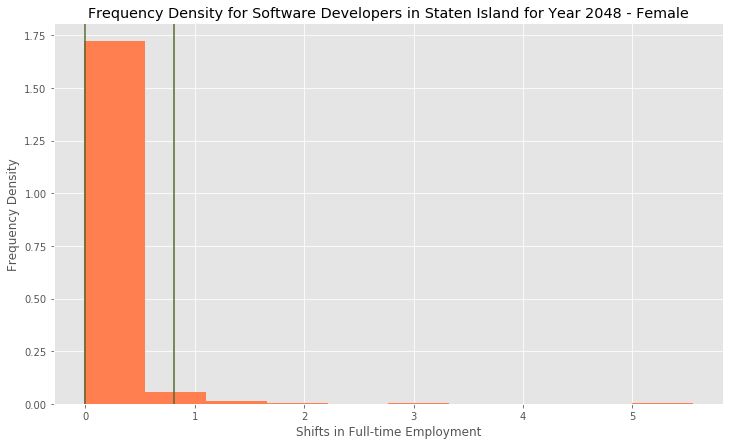

In [134]:
# Use the `plot` function to create a probability distribution histogram of simulated ending employment
# with markings for a 95% confidence interval
hist_cum_moves_software_staten = plt.figure()
ending_software_cumulative_moves_staten.plot(kind='hist', density=True, bins=10, color = 'coral', 
                             title='Frequency Density for Software Developers in Staten Island for Year 2048 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(confidence_interval_software_staten.iloc[0], color='darkolivegreen')
plt.axvline(confidence_interval_software_staten.iloc[1], color='darkolivegreen')
plt.show()

In [135]:
# Select the last row for project employment (employent statistics of each simulation on the last year)
tenth_software_cumulative_moves_staten = software_cumulative_moves_staten.iloc[-20, :]
tenth_software_cumulative_moves_staten.head()

0    0.743640
1    0.211732
2    0.302517
3    0.603205
4    0.679819
Name: 11, dtype: float64

In [136]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending employment
tenth_software_confidence_interval_staten = tenth_software_cumulative_moves_staten.quantile(q=[0.025, 0.975])
tenth_software_confidence_interval_staten

0.025    0.030700
0.975    1.969676
Name: 11, dtype: float64

In [137]:
# Use the `value_counts` function and the `len` function to calculate the probabilities of cumulative moves ranges
tenth_software_cumulative_moves_staten.value_counts(bins=10) / len(tenth_software_cumulative_moves_staten)

(-0.013999999999999999, 0.503]    0.692
(0.503, 1.015]                    0.202
(1.015, 1.526]                    0.060
(1.526, 2.037]                    0.021
(2.037, 2.548]                    0.014
(2.548, 3.059]                    0.006
(3.059, 3.57]                     0.002
(4.593, 5.104]                    0.001
(4.082, 4.593]                    0.001
(3.57, 4.082]                     0.001
Name: 11, dtype: float64

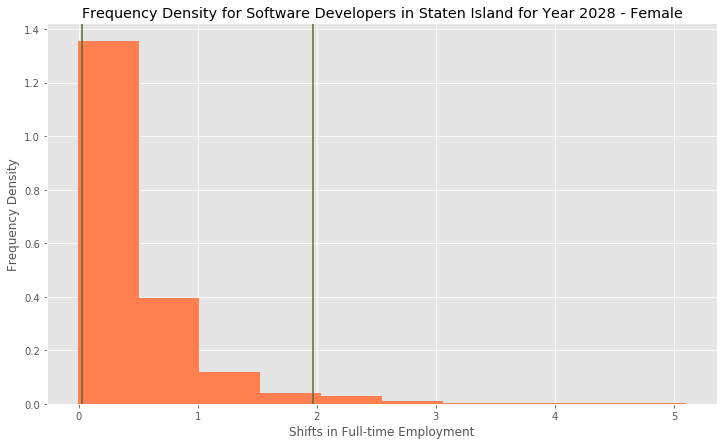

In [138]:
# Use the `plot` function to create a probability distribution histogram of simulated ending employment
# with markings for a 95% confidence interval
hist_tenth_software_cum_moves_staten = plt.figure()
tenth_software_cumulative_moves_staten.plot(kind='hist', density=True, bins=10, color = 'coral', 
                             title='Frequency Density for Software Developers in Staten Island for Year 2028 - Female', figsize=(12,7))
plt.xlabel('Shifts in Full-time Employment')
plt.ylabel('Frequency Density')
plt.axvline(tenth_software_confidence_interval_staten.iloc[0], color='darkolivegreen')
plt.axvline(tenth_software_confidence_interval_staten.iloc[1], color='darkolivegreen')
plt.show()

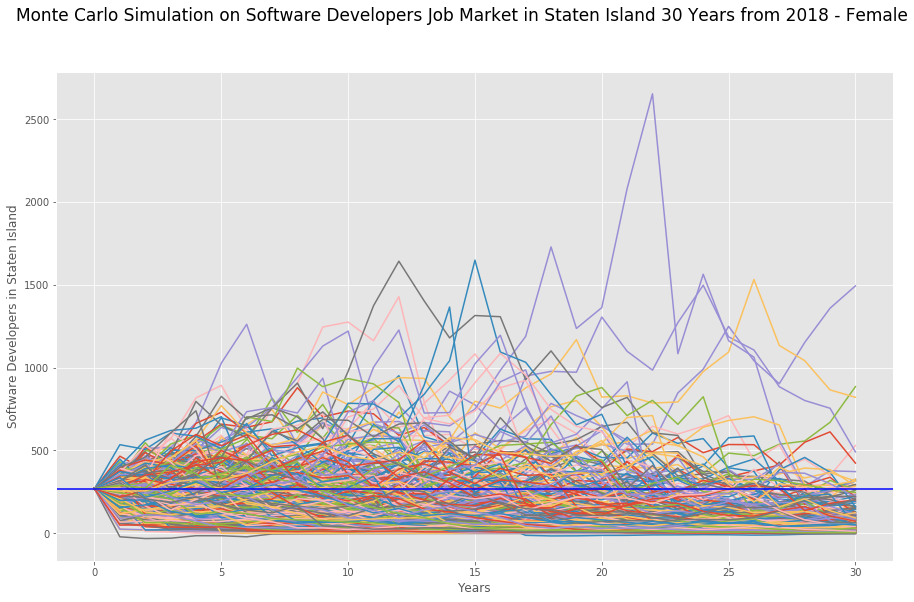

In [139]:
# Set initial employment
initial_software_staten = software_devops_female_last_staten 

fig_software_staten = plt.figure(figsize=(15,9))
fig_software_staten.suptitle('Monte Carlo Simulation on Software Developers Job Market in Staten Island 30 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_staten * initial_software_staten)
#plt.axhline(y = software_devops_male_last_staten, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_staten, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Staten Island')
plt.show()

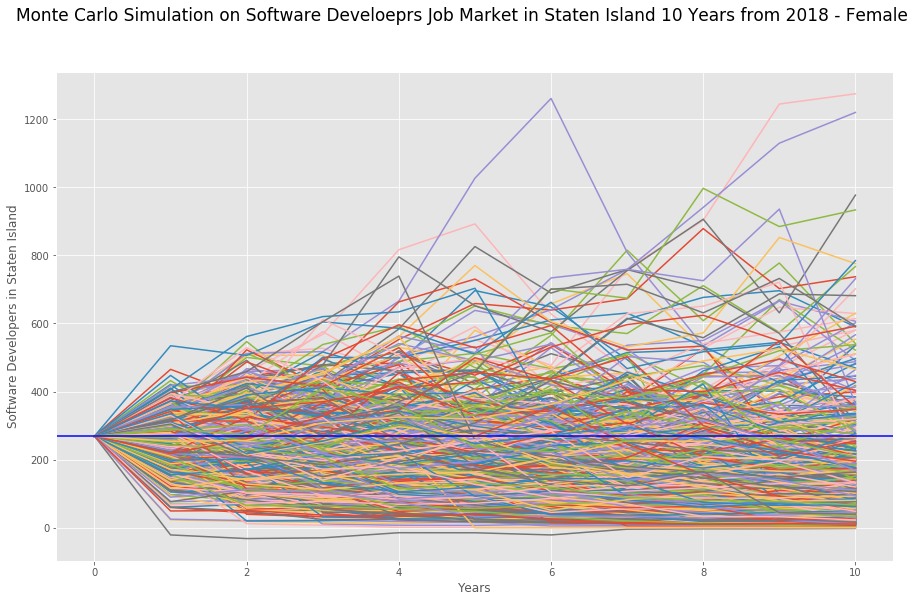

In [140]:
# Zooming in for the next 10 years from 2018
fig_software_staten = plt.figure(figsize=(15,9))
fig_software_staten.suptitle('Monte Carlo Simulation on Software Develoeprs Job Market in Staten Island 10 Years from 2018 - Female', fontsize=17)
plt.plot(software_cumulative_moves_staten.iloc[0:11, :] * initial_software_staten)
#plt.axhline(y = software_devops_male_last_staten, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_staten, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Staten Island')
plt.show()

In [141]:
# Calculate investment profit/loss of lower and upper bound cumulative portfolio returns
software_gnl_lower_bound_staten = initial_software_staten * confidence_interval_software_staten.iloc[0]
software_gnl_upper_bound_staten = initial_software_staten * confidence_interval_software_staten.iloc[1]
                                                    
# Print the results
print(f"There is a 95% chance that an initial employment of {initial_software_staten:,.0f}k for female software developers"
      f" in Staten Island over the next 30 years will end within in the range of"
      f" {software_gnl_lower_bound_staten:,.0f}k and {software_gnl_upper_bound_staten:,.0f}k.")

There is a 95% chance that an initial employment of 269k for female software developers in Staten Island over the next 30 years will end within in the range of 0k and 219k.


In [142]:
# Calculate investment profit/loss of lower and upper bound cumulative portfolio returns
tenth_software_gnl_lower_bound_staten = initial_software_staten * tenth_software_confidence_interval_staten.iloc[0]
tenth_software_gnl_upper_bound_staten = initial_software_staten * tenth_software_confidence_interval_staten.iloc[1]
                                                    
# Print the results
print(f"There is a 95% chance that an initial employment of {initial_software_staten:,.0f}k for female software developers"
      f" in Staten Island over the next 30 years will end within in the range of"
      f" {tenth_software_gnl_lower_bound_staten:,.0f}k and {tenth_software_gnl_upper_bound_staten:,.0f}k.")

There is a 95% chance that an initial employment of 269k for female software developers in Staten Island over the next 30 years will end within in the range of 8k and 530k.


In [143]:
software_trajectories_staten = initial_software_staten * software_cumulative_moves_staten.quantile(q=[0.05, 0.5, 0.95], axis='columns', numeric_only=True).T
software_trajectories_staten.columns = ['Lower 5%', 'Median', 'Upper 5%']
software_trajectories_staten

,Lower 5%,Median,Upper 5%
0,269.000000,269.000000,269.000000
1,141.275182,253.655230,365.480807
2,103.817574,232.720024,402.765793
3,75.157223,207.234199,420.090470
4,55.845840,179.738124,419.329545
5,44.508320,164.398498,406.050115
6,34.457359,146.476823,417.398632
7,30.472846,125.601604,399.381339
8,24.217090,113.248125,395.465227
9,21.031860,100.221716,423.113078


<Figure size 432x288 with 0 Axes>

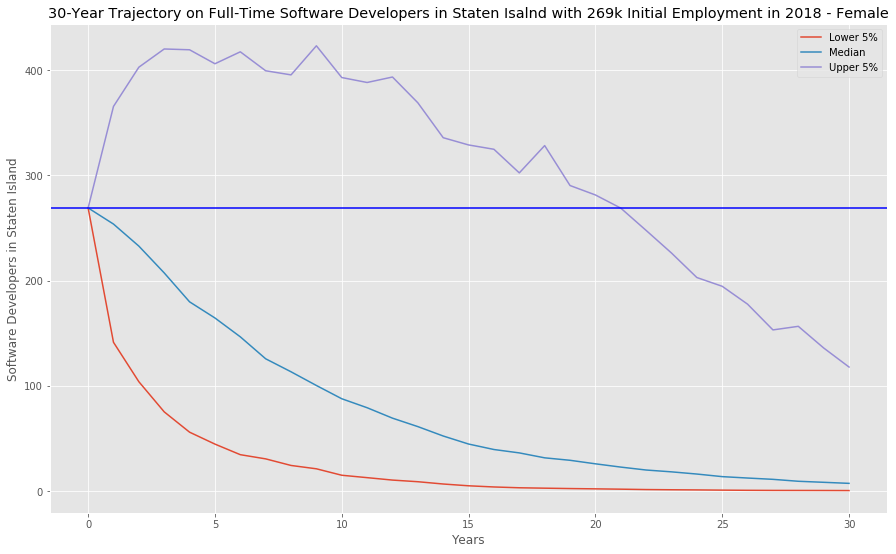

In [144]:
ax_cum_employed_staten = plt.figure()
software_trajectories_staten.plot(title="30-Year Trajectory on Full-Time Software Developers in Staten Isalnd with 269k Initial Employment in 2018 - Female",
                          figsize=(15, 9))
#plt.axhline(y = software_devops_male_last_staten, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_staten, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Staten Island')
plt.show()

<Figure size 432x288 with 0 Axes>

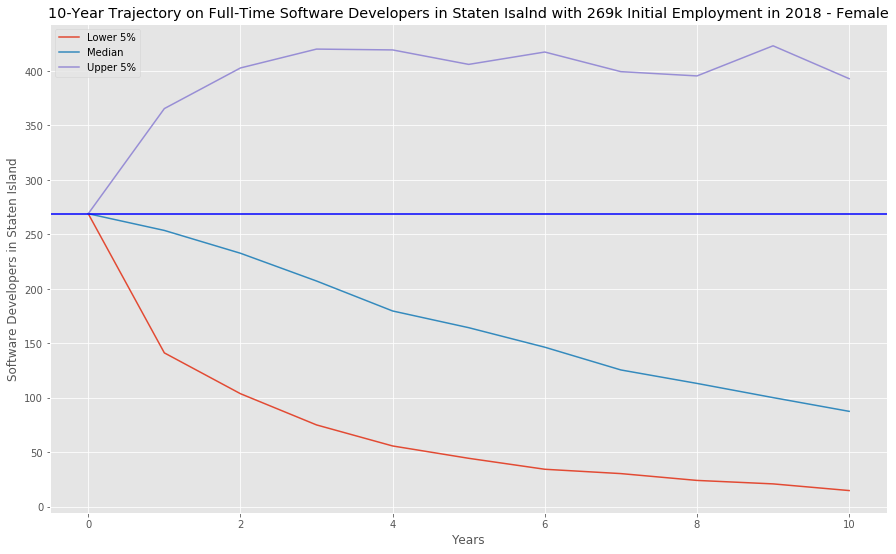

In [146]:
# 10-year Confidence Interval Trajectory
ax_cum_employed_staten = plt.figure()
software_trajectories_staten.iloc[0:11, :].plot(title="10-Year Trajectory on Full-Time Software Developers in Staten Isalnd with 269k Initial Employment in 2018 - Female",
                          figsize=(15, 9))
#plt.axhline(y = software_devops_male_last_staten, color = 'black', linestyle = '-')
plt.axhline(y = software_devops_female_last_staten, color = 'b', linestyle = '-')
plt.xlabel('Years')
plt.ylabel('Software Developers in Staten Island')
plt.show()